### Theory

#### 1. What is Time Series?

A time series is a sequence of data points collected or recorded at successive points in time, usually at uniform intervals.  Time series data is typically ordered chronologically and can be collected in regular intervals (e.g., daily, monthly, quarterly) or irregularly. Mathematically, a time series can be represented as:

\begin{equation*}
X=\left\{x_1, x_2, x_3, \ldots, x_t, \ldots, x_n\right\}
\end{equation*}

where $x_t$ represents the value at time $t$.

##### Properties and Characteristics of Time Series

1. Temporal Ordering: Data points are ordered chronologically
2. Time Dependence: Current values may depend on past values
3. Trend: Long-term increase or decrease in the data
4. Seasonality: Regular, predictable patterns that repeat over fixed periods
5. Cyclical Patterns: Fluctuations that don't have a fixed period
6. Irregular/Random Component (noise): Unpredictable fluctuations
7. Level: The average value around which the series fluctuates

#### 2. Time Series Analysis

- Understanding the underlying structure of the data
- Identifying trends, seasonal patterns, and cyclical behavior
- Building mathematical models to describe the data
- Making predictions about future values
- Detecting anomalies and outliers

#### 3. Time Series Decomposition

Time series decomposition separates a time series into components:
- Trend (T)
- Seasonality (S)
- Residual or Irregular (R)|

Types of Decomposition
- Additive: $Y_t=T_t+S_t+R_t$
- Multiplicative: $Y_t=T_t \times S_t \times R_t$

##### Types of Decomposition

1. Classical Decomposition
- Simple moving averages for trend extraction
- Seasonal indices calculation
- Limited flexibility
  
2. $\mathrm{X}-11 / \mathrm{X}-12 / \mathrm{X}-13$ ARIMA-SEATS
- Advanced government statistical methods
- Handle trading day effects and holidays

3. STL Decomposition (Seasonal and Trend decomposition using Loess)

#### 4. STL Decomposition Using LOESS

STL (Seasonal-Trend decomposition using LOESS) is a decomposition method for time series where:

\begin{equation*}
X_t=T_t+S_t+R_t
\end{equation*}

- $X_t$ : Original time series
- $T_t$ : Trend component
- $S_t$ : Seasonal component
- $R_t$ : Residual (remainder or noise)

##### LOESS (Locally Estimated Scatterplot Smoothing)

STL relies on LOESS to estimate smooth trend and seasonal components. LOESS performs local polynomial regression on nearby data points using a weighted least squares method.

Objective Function for LOESS:
For each point $x_i$, fit a second-order (quadratic) polynomial using neighboring points $x_j$ by minimizing:

\begin{equation*}
\min \sum_j w_j\left(x_i\right)\left[y_j-\beta_0-\beta_1\left(x_j-x_i\right)-\beta_2\left(x_j-x_i\right)^2\right]^2
\end{equation*}

- $\beta_0, \beta_1, \beta_2$ : Local polynomial coefficients
- $w_j\left(x_i\right)$ : Weight assigned to point $x_j$ when estimating $x_i$
- Weight Function:

\begin{equation*}
w_j\left(x_i\right)=W\left(\frac{\left|x_j-x_i\right|}{h}\right)
\end{equation*}

- $h$ : Span or bandwidth (controls the neighborhood size)
- W: Kernel function (typically tricube kernel)

##### STL Algorithm Steps:

1. Inner Loop: Seasonal smoothing $\rightarrow$ Detrending $\rightarrow$ Cycle-subseries smoothing
2. Outer Loop: Robustness weights for outlier handling

##### Advantages of STL:

- Handles any type of seasonality
- Robust to outliers
- Seasonal component can change over time
- User control over smoothing parameters

##### STL vs Classical Decomposition 

| Feature | STL | Classical Decomposition |
| :--- | :--- | :--- |
| Seasonality | Can change over time | Fixed |
| Outlier Robust | Yes | No |
| Additive only | Yes | Additive/Multiplicative |
| Flexibility | High | Low |


##### STL Limitations

1. Only handles additive decomposition
2. Computationally intensive
3. Requires parameter tuning
4. May over-smooth in some cases
5. Not suitable for very short time series


#### 5. Stationarity in Time Series

A time series is said to be stationary if its statistical properties remain constant over time. These properties include the mean, variance, and autocovariance structure.

A stochastic process $\left\{X_t\right\}$ is strictly stationary if:

\begin{equation*}
F\left(X_{t_1}, X_{t_2}, \ldots, X_{t_k}\right)=F\left(X_{t_1+h}, X_{t_2+h}, \ldots, X_{t_k+h}\right)
\end{equation*}

for all time points $t_1, t_2, \ldots, t_k$ and all time shifts $h$.
This means the joint distribution does not change when shifted in time.

##### Properties of Weak (Second-order) Stationarity

A stochastic process $\left\{X_t\right\}$ is weakly stationary (or second-order stationary) if:

1. Constant Mean:

\begin{equation*}
E\left[X_t\right]=\mu \quad \text { (independent of } t \text { ) }
\end{equation*}

2. Constant Variance:

\begin{equation*}
\operatorname{Var}\left(X_t\right)=\sigma^2 \quad \text { (independent of } t \text { ) }
\end{equation*}

3. Autocovariance Depends Only on Lag:

\begin{equation*}
\operatorname{Cov}\left(X_t, X_{t+k}\right)=\gamma_k \quad(\text { depends only on } k)
\end{equation*}

##### Importance and Need of Stationarity

1. Predictable Statistical Properties: Enables reliable forecasting
2. Model Validity: Many time series models assume stationarity
3. Statistical Inference: Valid hypothesis testing and confidence intervals
4. Parameter Estimation: Consistent and efficient estimators
5. Forecasting Accuracy: Better long-term predictions

##### Types of Stationarity

1. Strict Stationarity: All moments are time-invariant
2. Weak/Covariance Stationarity: Only first two moments are time-invariant
- Strict Stationarity: Distribution of $x_{t_1}, \ldots, x_{t_k}$ is same as $x_{t_1+h}, \ldots, x_{t_k+h}$
- Weak (Second-order) Stationarity: Mean, variance, autocovariance constant

#### Making a Time Series Stationary

##### 1. Differencing

Removes stochastic trends:

\begin{equation*}
\Delta X_t=X_t-X_{t-1}
\end{equation*}


Higher-order differencing:

\begin{equation*}
\Delta^d X_t=\Delta^{d-1} X_t-\Delta^{d-1} X_{t-1}
\end{equation*}

##### 2. Seasonal Differencing

Removes seasonal effects:

\begin{equation*}
\Delta_s X_t=X_t-X_{t-s}
\end{equation*}


Where $s$ is the seasonal period (e.g., 12 for monthly data with yearly seasonality).

##### 3. Detrending

Removes a deterministic trend (e.g., linear):
- Linear Detrending: Fit a regression line and subtract it
- Moving Average Detrending: Subtract smoothed values
  
##### 4. Transformation

Stabilizes variance:
- Log Transformation: $Y_t=\log \left(X_t\right)$
- Square Root: $Y_t=\sqrt{X_t}$
- Box-Cox Transformation:

\begin{equation*}
Y_t^{(\lambda)}= \begin{cases}\frac{X_t^\lambda-1}{\lambda}, & \lambda \neq 0 \\ \log \left(X_t\right), & \lambda=0\end{cases}
\end{equation*}

#### 7. Testing for Stationarity in Time Series

##### 1 Augmented Dickey-Fuller (ADF) Test

- Purpose:

Tests for the presence of a unit root, i.e., whether a time series is non-stationary.

- Hypotheses:
- Null Hypothesis ( $\mathrm{H}_0$ ): The series has a unit root (i.e., it is non-stationary).
- Alternative Hypothesis $\left(\mathrm{H}_1\right)$ : The series is stationary.
- Test Equation:

\begin{equation*}
\Delta y_t=\alpha+\beta t+\gamma y_{t-1}+\sum_{i=1}^p \delta_i \Delta y_{t-i}+\epsilon_t
\end{equation*}


Where:
- $\Delta y_t=y_t-y_{t-1}$ (first difference)
- $t$ : time trend (optional)
- $p$ : number of lagged difference terms to correct for autocorrelation
- $\gamma$ : coefficient for testing stationarity
- Decision Criteria:
- If p-value < 0.05: Reject $H_0 \rightarrow$ Series is stationary
- If test statistic < critical value: Reject $H_0$

##### 2 KPSS Test (Kwiatkowski-Phillips-Schmidt-Shin)

- Purpose:

Tests for trend or level stationarity.
- Hypotheses:
- Null Hypothesis ( $\mathrm{H}_0$ ): The series is stationary
- Alternative Hypothesis $\left(\mathrm{H}_1\right)$ : The series has a unit root (non-stationary)
- Test Statistic:

\begin{equation*}
\mathrm{KPSS}=\frac{1}{T^2} \sum_{t=1}^T \frac{S_t^2}{\hat{\sigma}^2}
\end{equation*}


Where:
- $S_t=\sum_{i=1}^t e_i$ : cumulative residuals from the regression of $y_t$ on a constant or trend
- $\hat{\sigma}^2$ : long-run variance of the residuals
- T: number of observations
- Decision Criteria:
- If p-value < 0.05: Reject $H_0 \rightarrow$ Series is non-stationary
- If test statistic > critical value: Reject $H_0$

Note: KPSS complements ADF - using both together gives stronger evidence for or against stationarity.

##### 3 Phillips-Perron (PP) Test

- Purpose:

Also tests for a unit root, like ADF, but adjusts for serial correlation and heteroskedasticity using nonparametric corrections.
- Hypotheses:
- Null Hypothesis (Ho): The series has a unit root (non-stationary)
- Alternative Hypothesis $\left(\mathrm{H}_1\right)$ : The series is stationary
- Test Statistic:

\begin{equation*}
P P_\tau=t_\gamma \sqrt{\frac{\hat{\sigma}^2}{\lambda^2}}-\frac{T\left(\lambda^2-\hat{\sigma}^2\right)}{2 \lambda^2} \sqrt{\frac{1}{T^2 \sum_{t=1}^T\left(y_{t-1}-\bar{y}_{-1}\right)^2}}
\end{equation*}


Where:
- $t_\gamma$ : t-statistic from regression
- $\hat{\sigma}^2$ : estimated variance of regression residuals
- $\lambda^2$ : consistent estimator of long-run variance
- $\bar{y}_{-1}$ : mean of lagged series
- T: number of observations
- Decision Criteria:
- If p-value < 0.05: Reject $H_0 \rightarrow$ Series is stationary

#### 8. White Noise vs Random Walk

White Noise:

\begin{equation*}
x_t \sim \mathcal{N}\left(0, \sigma^2\right)
\end{equation*}

- No autocorrelation, mean $=0$

Random Walk:

\begin{equation*}
x_t=x_{t-1}+\epsilon_t
\end{equation*}

- Non-stationary
- Forecast = last observed value

#### 9. Time Series Forecasting Models

1) AR (Autoregressive)

\begin{equation*}
x_t=\phi_1 x_{t-1}+\cdots+\phi_p x_{t-p}+\epsilon_t
\end{equation*}

2) MA (Moving Average)

\begin{equation*}
x_t=\epsilon_t+\theta_1 \epsilon_{t-1}+\cdots+\theta_q \epsilon_{t-q}
\end{equation*}

3) ARMA

\begin{equation*}
x_t=\sum_{i=1}^p \phi_i x_{t-i}+\sum_{j=1}^q \theta_j \epsilon_{t-j}+\epsilon_t
\end{equation*}

4) ARIMA (Integrated = differencing)

\begin{equation*}
\operatorname{ARIMA}(p, d, q)
\end{equation*}

5) SARIMA (Seasonal ARIMA)

\begin{equation*}
\operatorname{ARIMA}(p, d, q)(P, D, Q)_s
\end{equation*}

6) VAR (Vector AR)

Multivariate extension of AR:

\begin{equation*}
\mathbf{y}_t=A_1 \mathbf{y}_{t-1}+\cdots+A_p \mathbf{y}_{t-p}+\epsilon_t
\end{equation*}

7) VMA (Vector MA)

\begin{equation*}
\mathbf{y}_t=\mu+\sum_{i=1}^q \Theta_i \epsilon_{t-i}+\epsilon_t
\end{equation*}

8) VARMA / VARIMA
- Combine AR and MA for multivariate
- VARIMA includes differencing


#### 10. Smoothing Methods

Importance:
- Remove noise
- Highlight trend and seasonality

Moving Average:

\begin{equation*}
S_t=\frac{1}{k} \sum_{i=t-k+1}^t x_i
\end{equation*}


Exponential Smoothing:

\begin{equation*}
S_t=\alpha x_t+(1-\alpha) S_{t-1}
\end{equation*}

#### 11. ACF \& PACF

ACF:

Measures correlation with lagged values:

\begin{equation*}
\rho(h)=\frac{\operatorname{Cov}\left(x_t, x_{t+h}\right)}{\sigma^2}
\end{equation*}


PACF:

Correlation of lag $h$ after removing effects of lags 1 to $h-1$
Use:
- ACF for MA order
- PACF for AR order

#### 12. Model Evaluation Metrics

- MSE: $\frac{1}{n} \sum\left(y_t-\hat{y}_t\right)^2$
- RMSE: $\sqrt{M S E}$
- MAE: $\frac{1}{n} \sum\left|y_t-\hat{y}_t\right|$
- MAPE: $\frac{100 \%}{n} \sum\left|\frac{y_t-\hat{y}_t}{y_t}\right|$
- AIC: $2 k-2 \ln (L)$
- BIC: $k \ln (n)-2 \ln (L)$

#### 13. Data Preprocessing

Handling Missing Values
- Imputation (mean, median)
- Interpolation (linear, spline)

Making Stationary
- Differencing, detrending, transformation

Handling Outliers
- Z-score, IQR, robust decomposition

Resampling
- Upsampling: daily $\rightarrow$ hourly
- Downsampling: daily $\rightarrow$ monthly

### Time series analysis steps

#### 1. Problem Definition
- Clarify Objective: Forecast future values? Detect anomalies? Understand patterns?
- Define Horizon: How far ahead do you want to forecast (e.g., 1 day, 12 months)?
- Determine Granularity: Daily, weekly, monthly, etc.
  
#### 2. Data Collection
- Gather time-stamped observations
- Ensure consistency in frequency and time format
- Common sources: CSVs, databases, APls (e.g., Yahoo Finance, loT sensors, logs)

#### 3. Data Preprocessing
a. Handle Missing Values
- Methods: Interpolation, forward/backward fill, model-based imputation
  
b. Outl ier Detection $8 x$ Treatment
- Use rolling statistics, IQR, z-score, or robust smoothing
- Replace, cap, or remove outliers if needed
  
c. Resampling (Optional)
- Upsampling: Daily $\rightarrow$ Hourly (fill gaps)
- Downsampling: Minute $\rightarrow$ Daily (aggregate)
  
d. Transformation (if needed)
- Stabilize variance: log, square root, Box-Cox
- Normalize/standardize if required for models

#### 4. Exploratory Data Analysis (EDA)
a. Visual Inspection
- Time plots
- Seasonal plots
- Lag plots
  
b. Summary Statistics
- Mean, variance, autocorrelation
  
c. ACF and PACF Plots
- Determine lags for AR/MA components

Plot the time series to visualize overall patterns, trends, and potential anomalies. Calculate basic statistics like mean, variance, and examine the distribution of values. Look for obvious patterns such as trends, seasonality, or cyclical behavior.

#### 5. Time Series Decomposition

Break the series into components:

\begin{equation*}
X_t=T_t+S_t+R_t
\end{equation*}

- $\mathrm{T}_{\mathrm{t}}$ : Trend
- $\mathrm{S}_{\mathrm{r}}$ : Seasonality
- $\mathrm{R}_{\mathrm{t}}$ : Residual/Noise

Methods:
- Classical decomposition
- STL (Seasonal and Trend decomposition using LOESS)

Break down the time series into its core components: trend (long-term direction), seasonality (regular patterns that repeat), cyclical patterns (longer-term fluctuations), and irregular/random components. This helps identify which elements drive the data's behavior.

#### 6. Stationarity Check

a. Visual Checks
- Constant mean and variance over time?
  
b. Statistical Tests
- Augmented Dickey-Fuller (ADF)
- KPSS
- Phillips-Perron

Test whether the series is stationary (constant mean and variance over time) using statistical tests like the Augmented Dickey-Fuller test. Most time series models require stationarity, so this step determines if transformation is needed.

#### 7. Make Series Stationary (if needed)

- Differencing: $\Delta X_t=X_t-X_{t-1}$
- Detrending: Remove deterministic trend
- Transformations: Log, Box-Cox
- Seasonal differencing: $\Delta_s X_t=X_t-X_{t-s}$

If the series isn't stationary, apply transformations such as differencing (subtracting previous values), logarithmic transformation, or detrending to achieve stationarity. You may need multiple rounds of transformation.

#### 8. Model Selection and Fitting

Examine autocorrelation function (ACF) and partial autocorrelation function (PACF) plots to identify appropriate model parameters. This helps determine the order of autoregressive (AR), moving average (MA), or integrated (I) components for ARIMA models.

a. Classical Statistical Models
- AR, MA, ARMA, ARIMA, SARIMA
- VAR, VARMA (for multivariate)
  
b. Smoothing Techniques
- Moving Average
- Exponential Smoothing (e.g., Holt-Winters)
  
c. Machine Learning Models
- Random Forest, XGBoost
- SVR, kNN
  
d. Deep Learning Models
- RNN, LSTM, GRU
- Temporal Convolutional Networks (TCN)

#### 9. Model Diagnostics
- Residual Analysis: Should be white noise
- ACF of residuals: No significant autocorrelation
- Check stationarity of residuals

Validate the model by examining residuals (the differences between actual and predicted values). Residuals should be normally distributed, have constant variance, and show no autocorrelation. Use statistical tests and diagnostic plots to verify these assumptions.

If you've tested multiple models, compare their performance using criteria like AIC (Akaike Information Criterion), BIC (Bayesian Information Criterion), or cross-validation metrics to select the best performing model.

#### 10. Forecasting
- Use the trained model to forecast future points
- Generate prediction intervals if needed

Use the validated model to make predictions for future time periods. Generate point forecasts along with confidence intervals to quantify uncertainty in your predictions.

#### 11. Model Evaluation

Use appropriate evaluation metrics:
- MAE (Mean Absolute Error)
- MSE (Mean Squared Error)
- RMSE
- MAPE (Mean Absolute Percentage Error)
- AIC/BIC (for model selection)
  
#### 12. Model Tuning \& Validation
- Use rolling forecasts or time series cross-validation (e.g., walk-forward validation)
- Tune hyperparameters (e.g., ARIMA(p,d,q))
  
#### 13. Deployment 8 Monitoring
- Automate prediction pipeline
- Monitor drift, performance degradation, and seasonality changes

### Test case


In [5]:
import yfinance as yf
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
stock_data = yf.download('AAPL', start='2024-01-01',auto_adjust=False)
stock_data.head(10)


[*********************100%***********************]  1 of 1 completed


Price,Adj Close,Close,High,Low,Open,Volume
Ticker,AAPL,AAPL,AAPL,AAPL,AAPL,AAPL
Date,,,,,,
2024-01-02,184.290421,185.639999,188.440002,183.889999,187.149994,82488700
2024-01-03,182.910522,184.250000,185.880005,183.429993,184.220001,58414500
2024-01-04,180.587540,181.910004,183.089996,180.880005,182.149994,71983600
2024-01-05,179.862839,181.179993,182.759995,180.169998,181.990005,62303300
2024-01-08,184.211014,185.559998,185.600006,181.500000,182.089996,59144500
2024-01-09,183.794067,185.139999,185.149994,182.729996,183.919998,42841800
2024-01-10,184.836426,186.190002,186.399994,183.919998,184.350006,46792900
2024-01-11,184.240784,185.589996,187.050003,183.619995,186.539993,49128400


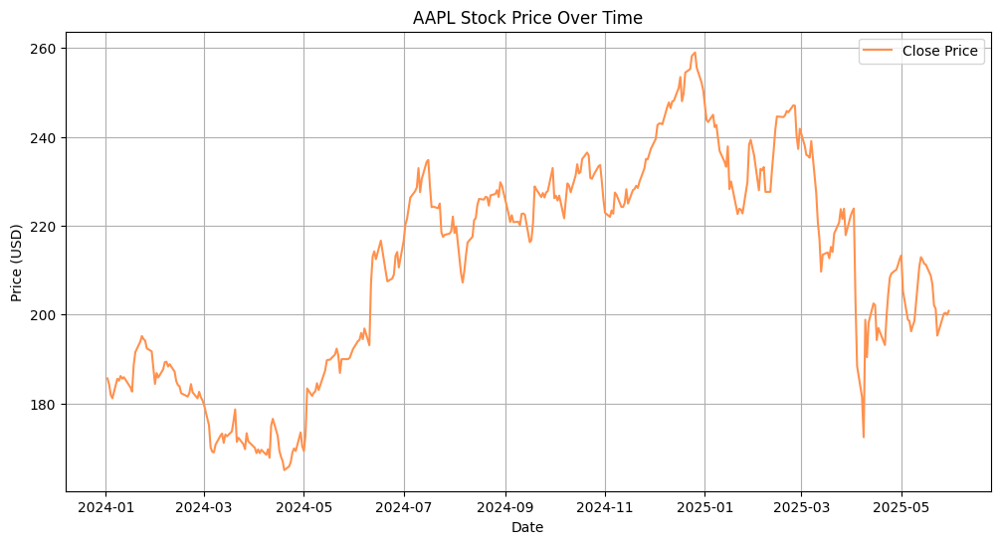

In [8]:
plt.figure(figsize=(12, 6))
plt.plot(stock_data.index, stock_data['Close'], label='Close Price', color = '#FF914D')
plt.title('AAPL Stock Price Over Time')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.legend()
plt.grid(True)
plt.show()


In [9]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition_additive = seasonal_decompose(stock_data['Close'], model='additive', period=30)


In [10]:
trend_additive = decomposition_additive.trend
seasonal_additive = decomposition_additive.seasonal
residual_additive = decomposition_additive.resid


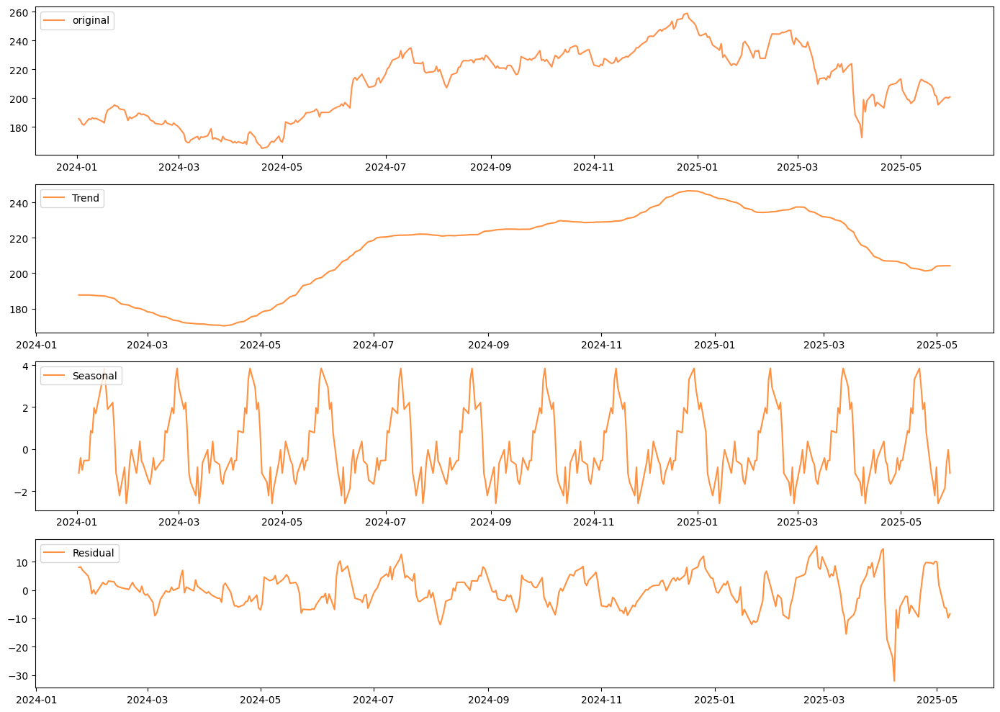

In [14]:
plt.figure(figsize=(14, 10))
plt.subplot(411)
plt.plot(stock_data['Close'], label='original', color = '#FF914D')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(trend_additive, label='Trend', color = '#FF9140')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(seasonal_additive, label='Seasonal', color = '#FF9140')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(residual_additive, label='Residual', color = '#FF9140')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()


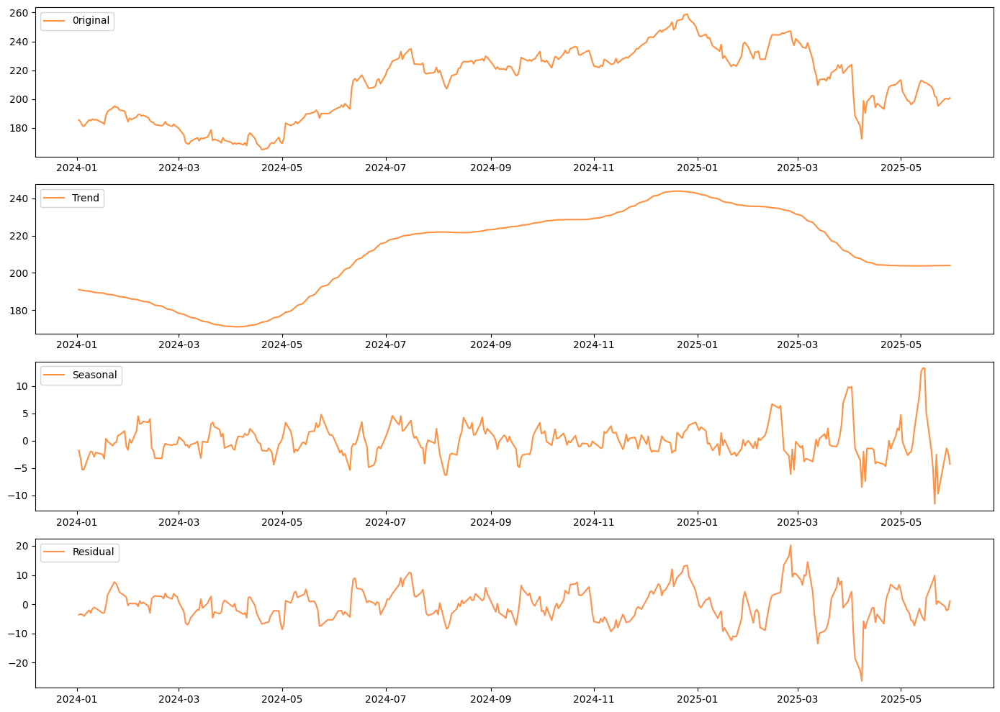

In [16]:
from statsmodels.tsa.seasonal import STL

# Perform STL decomposition
stl = STL(stock_data['Close'], period=30)
result = stl.fit()

# Plot the decomposition components
plt.figure(figsize=(14, 10))
plt.subplot(411)
plt.plot(result.observed, label='0riginal', color = '#FF9140')
plt.legend(loc='upper left')
plt.subplot(412)
plt.plot(result.trend, label='Trend', color = '#FF9140')
plt.legend(loc='upper left')
plt.subplot(413)
plt.plot(result.seasonal, label='Seasonal', color = '#FF9140')
plt.legend(loc='upper left')
plt.subplot(414)
plt.plot(result.resid, label='Residual', color = '#FF914D')
plt.legend(loc='upper left')
plt.tight_layout()
plt.show()


### Test 1

In [21]:
from statsmodels.tsa.stattools import adfuller

# Perform the Augmented Dickey-Fuller test
adf_test = adfuller(stock_data['Close'])
print('ADF Test Results:')
print(f'ADF Statistic: {round(adf_test[0],3)}')
print(f'p-value: {round(adf_test[1],3)}')
print('Critical Values:')
for key, value in adf_test[4].items():
    print(f' {key}: {round(value,3)}')


ADF Test Results:
ADF Statistic: -1.777
p-value: 0.392
Critical Values:
 1%: -3.449
 5%: -2.87
 10%: -2.571


In [27]:
from statsmodels.tsa.stattools import kpss
# Perform the KPSS test
kpss_test = kpss(stock_data['Close'], regression='ct') #'c' for constant (level stationarity), 'ct' for trend
print('KPSS Test Results:')
print(f'KPSS Statistic: {round(kpss_test[0],2)}')
print(f'p-value: {kpss_test[1]}')
print('Critical Values:')
for key, value in kpss_test[3].items():
    print(f' {key}: {value}')


KPSS Test Results:
KPSS Statistic: 0.5
p-value: 0.01
Critical Values:
 10%: 0.119
 5%: 0.146
 2.5%: 0.176
 1%: 0.216


C:\Users\HP\AppData\Local\Temp\ipykernel_30920\2026408035.py:3: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(stock_data['Close'], regression='ct') #'c' for constant (level stationarity), 'ct' for trend


In [28]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp

# Set seed for reproducibility
np.random.seed(0)
n = 500

# Strictly stationary series: normally distributed random noise
strict_stationary_series = np.random.normal(0, 1, n)

# Non-strictly stationary series: changing variance
non_strict_stationary_series = np.concatenate([
    np.random.normal(0, 1, n // 2),
    np.random.normal(0, 2, n // 2)
])

# Function to split the series into two halves and perform the K-S test
def ks_test_stationarity(series):
    split = len(series) // 2
    series_first_half = series[:split]
    series_second_half = series[split:]
    stat, p_value = ks_2samp(series_first_half, series_second_half)
    return stat, p_value

# Perform the K-S test on strictly stationary series
ks_stat_strict, ks_pvalue_strict = ks_test_stationarity(strict_stationary_series)
print("Strict Stationary Series:")
print(f"K-S Statistic: {ks_stat_strict:.4f}, p-value: {ks_pvalue_strict:.4f}")

# Perform the K-S test on non-strictly stationary series
ks_stat_non_strict, ks_pvalue_non_strict = ks_test_stationarity(non_strict_stationary_series)
print("\nNon-Strict Stationary Series:")
print(f"K-S Statistic: {ks_stat_non_strict:.4f}, p-value: {ks_pvalue_non_strict:.4f}")


Strict Stationary Series:
K-S Statistic: 0.0680, p-value: 0.6109

Non-Strict Stationary Series:
K-S Statistic: 0.1840, p-value: 0.0004


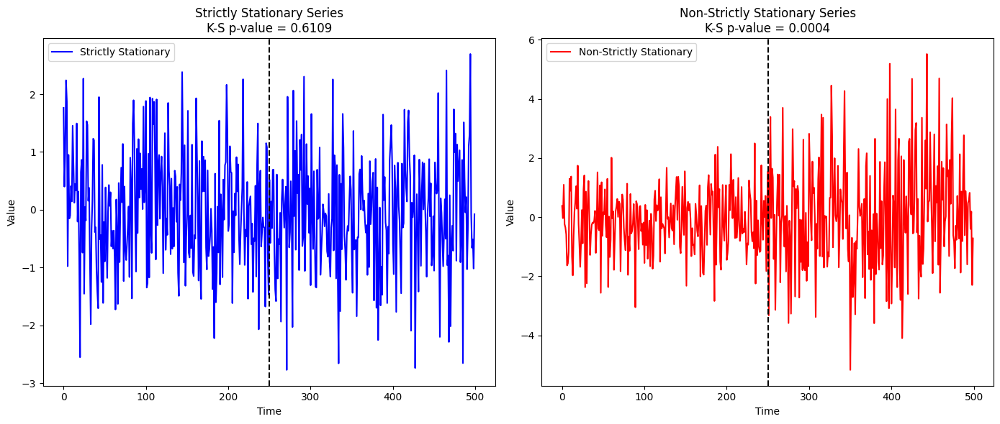

In [29]:

# Plotting
plt.figure(figsize=(14, 6))

# Plot strictly stationary series
plt.subplot(1, 2, 1)
plt.plot(strict_stationary_series, color='blue', label='Strictly Stationary')
plt.axvline(x=n//2, color='black', linestyle='--')
plt.title(f'Strictly Stationary Series\nK-S p-value = {ks_pvalue_strict:.4f}')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()

# Plot non-strictly stationary series
plt.subplot(1, 2, 2)
plt.plot(non_strict_stationary_series, color='red', label='Non-Strictly Stationary')
plt.axvline(x=n//2, color='black', linestyle='--')
plt.title(f'Non-Strictly Stationary Series\nK-S p-value = {ks_pvalue_non_strict:.4f}')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()

plt.tight_layout()
plt.show()

In [42]:
from statsmodels.tsa.stattools import adfuller, kpss

# Augmented Dickey-Fuller (ADF) Test
def adf_test(series):
    print("ADF Test:")
    result = adfuller(series)
    print(f'ADF Statistic: {result[0]:.4f}')
    print(f'p-value: {result[1]:.4f}')
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'  {key}: {value:.4f}')
    print()

# KPSS Test
def kpss_test(series):
    print("KPSS Test:")
    result = kpss(series, regression='c')  # use 'ct' for trend stationarity
    print(f'KPSS Statistic: {result[0]:.4f}')
    print(f'p-value: {result[1]:.4f}')
    print('Critical Values:')
    for key, value in result[3].items():
        print(f'  {key}: {value:.4f}')
    print()



In [81]:
prices = stock_data['Close']
prices_diff = prices.diff().dropna()


In [82]:
adf_test(prices)

ADF Test:
ADF Statistic: -1.7767
p-value: 0.3921
Critical Values:
  1%: -3.4492
  5%: -2.8698
  10%: -2.5712



In [83]:
import numpy as np
from scipy import stats
# Log transformation
prices_log = np.log(prices.dropna()).dropna()
# Square root transformation
prices_sqrt = np.sqrt(prices)



In [84]:
# If these are returns, use standardization (z-score normalization)
from scipy.stats import zscore

aapl_returns = prices['AAPL']
aapl_zscore = zscore(aapl_returns)

# Convert returns to synthetic prices (assuming 100 as base price)
aapl_prices = 100 + aapl_returns.cumsum()

# Filter positive values for Box-Cox
aapl_prices_positive = aapl_prices[aapl_prices > 0]

# Apply Box-Cox
from scipy.stats import boxcox
aapl_boxcox, lam = boxcox(aapl_prices_positive)

In [85]:
adf_test(prices_sqrt.dropna())

ADF Test:
ADF Statistic: -1.7732
p-value: 0.3938
Critical Values:
  1%: -3.4492
  5%: -2.8698
  10%: -2.5712



In [86]:
adf_test(prices_log.dropna())

ADF Test:
ADF Statistic: -1.5803
p-value: 0.4935
Critical Values:
  1%: -3.4492
  5%: -2.8699
  10%: -2.5712



In [87]:
adf_test(prices_diff.dropna())

ADF Test:
ADF Statistic: -11.0678
p-value: 0.0000
Critical Values:
  1%: -3.4492
  5%: -2.8698
  10%: -2.5712



In [90]:
import numpy as np
from scipy import signal

# Assume `prices` is a 1D pandas Series or NumPy array
# For example: prices = df['AAPL']

# Ensure it's a NumPy array for polyfit
x = np.arange(len(prices))
y = prices.values if hasattr(prices, 'values') else prices

# Fit a linear trend
trend = np.polyfit(x, y, 1)
trendline = np.polyval(trend, x)

# Detrend the data
prices_detrended = y - trendline


In [92]:
adf_test(prices_detrended)

ADF Test:
ADF Statistic: -6.4381
p-value: 0.0000
Critical Values:
  1%: -3.4497
  5%: -2.8701
  10%: -2.5713



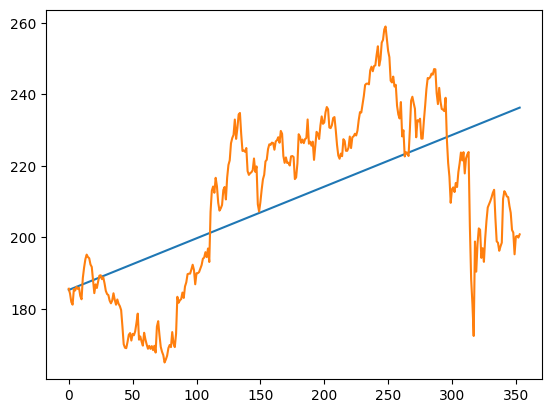

In [94]:
plt.plot(np.arange(len(prices)), trendline)
plt.plot(np.arange(len(prices)), prices)
plt.show()


In [91]:
# Using a moving average to remove trend
window = 12  # Example window size
prices_ma = prices.rolling(window=window).mean()
prices_detrended = prices - prices_ma
prices_detrended = prices_detrended.dropna()


In [96]:
adf_test(prices_detrended)

ADF Test:
ADF Statistic: -6.4381
p-value: 0.0000
Critical Values:
  1%: -3.4497
  5%: -2.8701
  10%: -2.5713



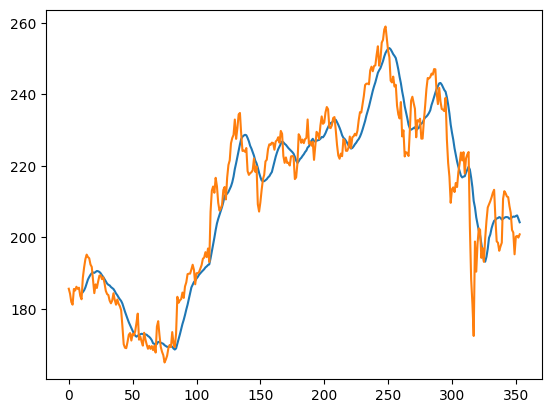

In [98]:
plt.plot(np.arange(len(prices)), prices_ma)
plt.plot(np.arange(len(prices)), prices)
plt.show()


In [106]:
from statsmodels.tsa.seasonal import seasonal_decompose
# Seasonal decomposition using moving averages
prices=prices['AAPL']
decomposition = seasonal_decompose(prices, model='additive', period=30)
prices_adjusted = prices / decomposition.seasonal
prices_adjusted = prices_adjusted.dropna()


In [109]:
adf_test(prices_detrended)

ADF Test:
ADF Statistic: -6.4381
p-value: 0.0000
Critical Values:
  1%: -3.4497
  5%: -2.8701
  10%: -2.5713



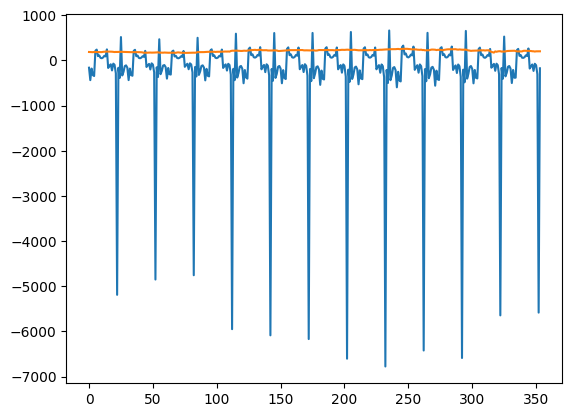

In [110]:
plt.plot(np.arange(len(prices)), prices_adjusted)
plt.plot(np.arange(len(prices)), prices)
plt.show()


#### check random walk or white noise

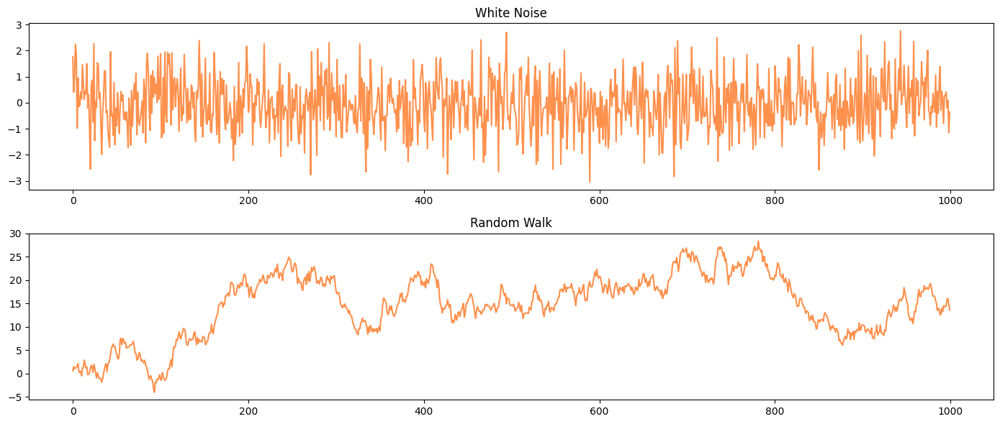


Ljung-Box Test for White Noise:
      lb_stat  lb_pvalue
10  14.025574   0.171828

Ljung-Box Test for Random Walk:
        lb_stat  lb_pvalue
10  8828.660312        0.0


In [115]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.stats.diagnostic import acorr_ljungbox  # Corrected function name

# Generating white noise and random walk for comparison
np.random.seed(0)
n = 1000

# White Noise
white_noise = np.random.normal(0, 1, n)

# Random Walk
random_shocks = np.random.normal(0, 1, n)
random_walk = np.cumsum(random_shocks)

# Plotting the series
plt.figure(figsize=(14, 6))  # Fixed typo: figsizem → figsize

plt.subplot(2, 1, 1)
plt.plot(white_noise, color='#FF914D')
plt.title('White Noise')

plt.subplot(2, 1, 2)
plt.plot(random_walk, color='#FF914D')
plt.title('Random Walk')

plt.tight_layout()
plt.show()

# Ljung-Box test
print("\nLjung-Box Test for White Noise:")
lb_test_white_noise = acorr_ljungbox(white_noise, lags=[10], return_df=True)
print(lb_test_white_noise)
print("\nLjung-Box Test for Random Walk:")
lb_test_random_walk = acorr_ljungbox(random_walk, lags=[10], return_df=True)
print(lb_test_random_walk)


### Time Series Forecasting Models

#### AR

In [116]:
import yfinance as yf

# Download stock data
stock_data = yf.download('AAPL', start='2023-01-01')

# Make data stationary using first difference
apple_price_stationary = stock_data['Close'].diff().dropna()

# Split the data into training and testing datasets
train_data = apple_price_stationary[:-30]
test_data = apple_price_stationary[-30:]


[*********************100%***********************]  1 of 1 completed


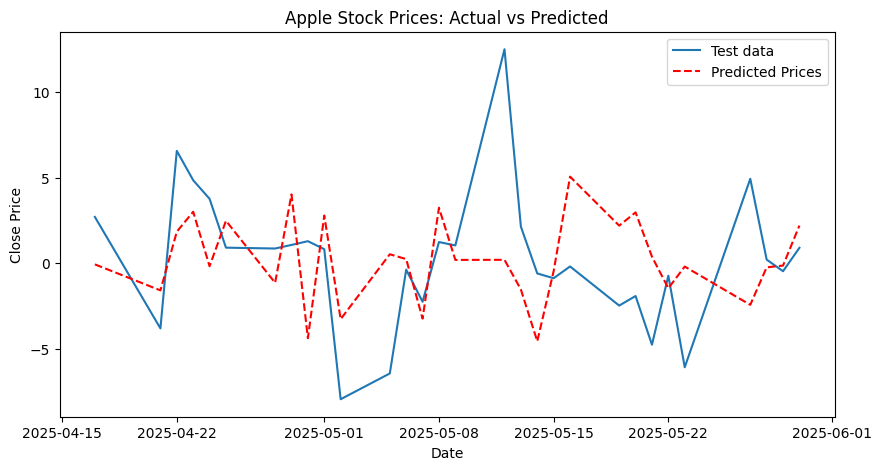

RMSE:  4.3


In [120]:
from statsmodels.tsa.ar_model import AutoReg
from sklearn.metrics import mean_squared_error
import numpy as np
import warnings
warnings.filterwarnings('ignore')
# Fit the Autoregressive model (AR) to the training data
model = AutoReg(train_data, lags = 30)
model_fit = model.fit()

# Make predictions on the test data
predictions = model_fit.predict(
    start=len(train_data),
    end=len(train_data) + len(test_data)-1,
    dynamic=False)

# Plot the actual vs predicted values
plt.figure(figsize=(10, 5))
plt.plot(test_data.index, test_data, label='Test data')
plt.plot(test_data.index, predictions, color='red', linestyle='--', label='Predicted Prices')
plt.title('Apple Stock Prices: Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# evaluating model using RMSE score
rmse = round(np.sqrt(mean_squared_error(test_data, predictions)),2)
print('RMSE: ',rmse)



#### MA Model

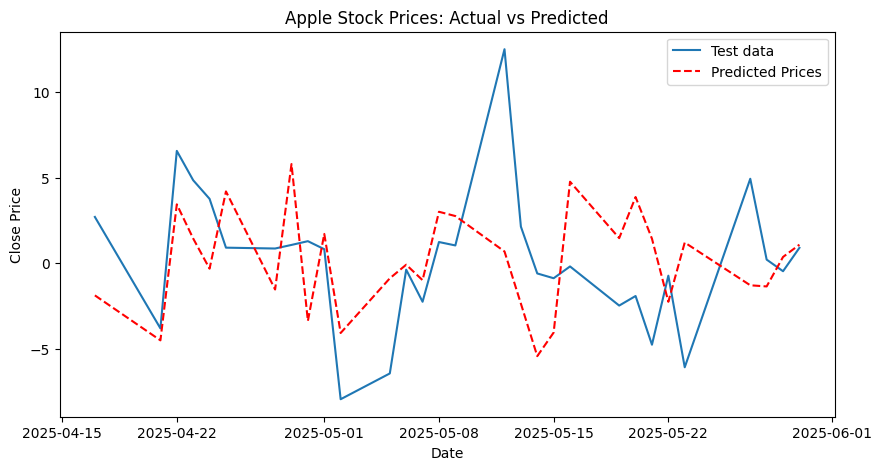

RMSE:  4.39


In [121]:
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt

# Fit the Moving Average (MA) model to the training data
model = ARIMA(train_data, order=(0, 0, 30))  # MA(30) model
model_fit = model.fit()

# Make predictions on the test data
predictions = model_fit.predict(
    start=len(train_data),
    end=len(train_data) + len(test_data) - 1,
    dynamic=False
)

# Plot the actual vs predicted values
plt.figure(figsize=(10, 5))
plt.plot(test_data.index, test_data, label='Test data')
plt.plot(test_data.index, predictions, color='red', linestyle='--', label='Predicted Prices')
plt.title('Apple Stock Prices: Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()


# evaluating model using RMSE score
rmse = round(np.sqrt(mean_squared_error(test_data, predictions)),2)
print('RMSE: ',rmse)



#### ARMA Model

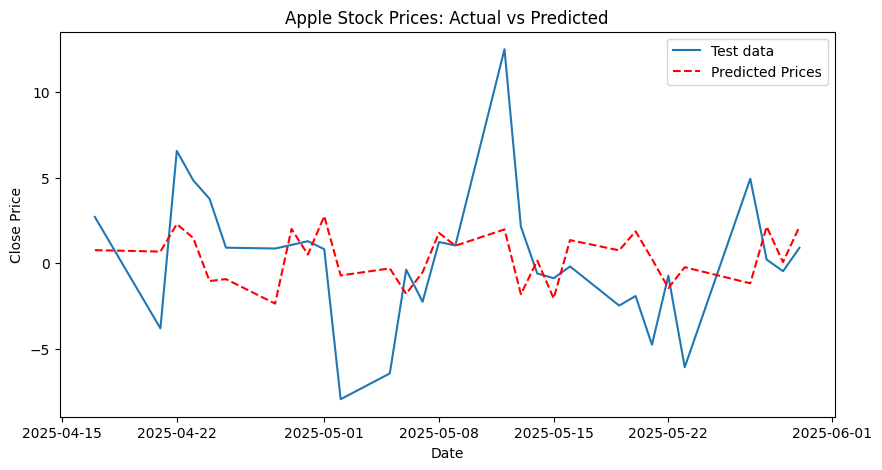

RMSE:  3.87


In [123]:
model = ARIMA(train_data, order=(7,0,7))
model_fit = model.fit()
# Make predictions on the test data
predictions = model_fit.predict(
    start=len(train_data),
    end=len(train_data) + len(test_data)-1,
    dynanic=False)
# Plot the actual vs predicted values
plt.figure(figsize=(10, 5))
plt.plot(test_data.index, test_data, label='Test data')
plt.plot(test_data.index, predictions, color='red', linestyle='--', label='Predicted Prices')
plt.title('Apple Stock Prices: Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()
# evaluating model using RMSE score
rmse = round(np.sqrt(mean_squared_error(test_data, predictions)),2)
print('RMSE: ',rmse)


#### ARIMA Model

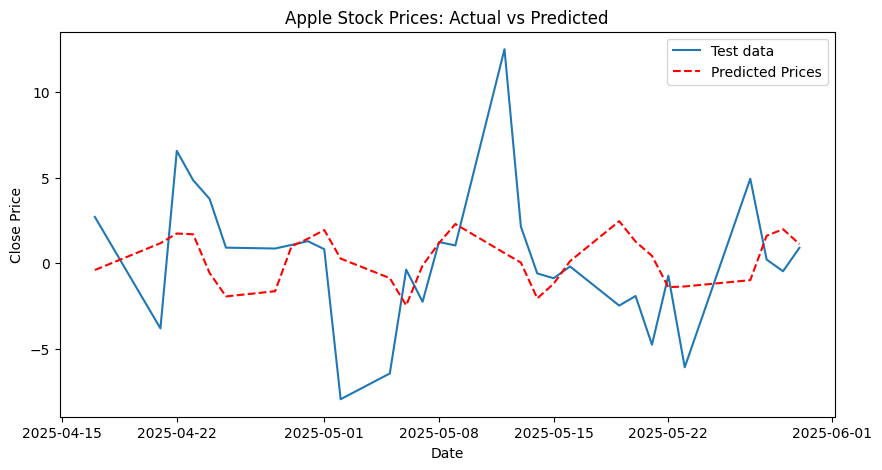

RMSE:  4.03


In [149]:
model = ARIMA(train_data, order=(7,1,7))
model_fit = model.fit()
# Make predictions on the test data
predictions = model_fit.predict(
    start=len(train_data),
    end=len(train_data) + len(test_data)-1,
    dynanic=False)
# Plot the actual vs predicted values
plt.figure(figsize=(10, 5))
plt.plot(test_data.index, test_data, label='Test data')
plt.plot(test_data.index, predictions, color='red', linestyle='--', label='Predicted Prices')
plt.title('Apple Stock Prices: Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()
# evaluating model using RMSE score
rmse = round(np.sqrt(mean_squared_error(test_data, predictions)),2)
print('RMSE: ',rmse)


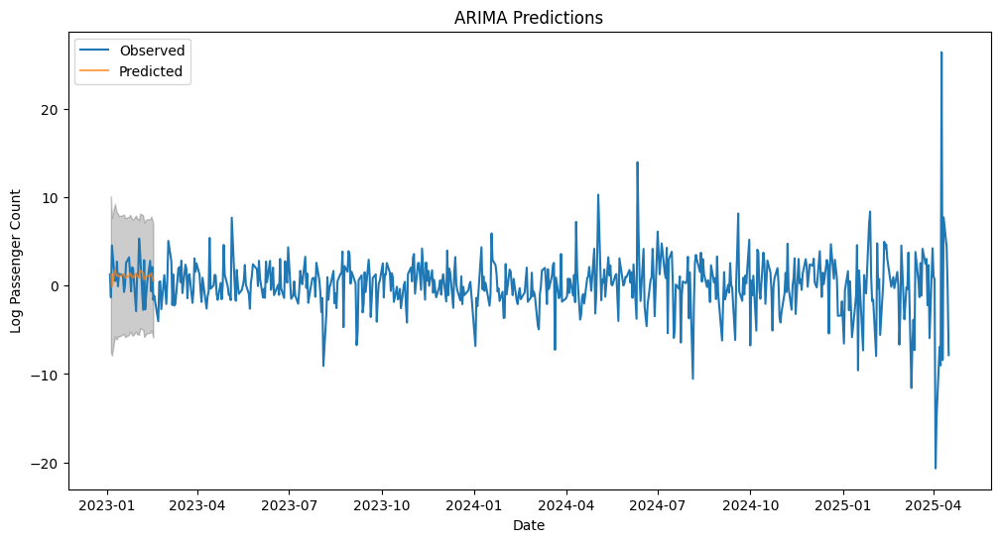

In [157]:
# Get in-sample predictions
pred = model_fit.get_prediction(start=1, end=30)
pred_mean = pred.predicted_mean
pred_ci = pred.conf_int()

# Plot the results
fig, ax = plt.subplots(figsize=(12, 6))

# Plot the original data
ax.plot(train_data, label='Observed')

# Plot the predicted values
ax.plot(pred_mean, label='Predicted', alpha=0.7)

# Plot confidence intervals
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1],
                color='k', alpha=0.2)

ax.set_title('ARIMA Predictions')
ax.set_xlabel('Date')
ax.set_ylabel('Log Passenger Count')
ax.legend()

plt.show()

#### SARIMAX

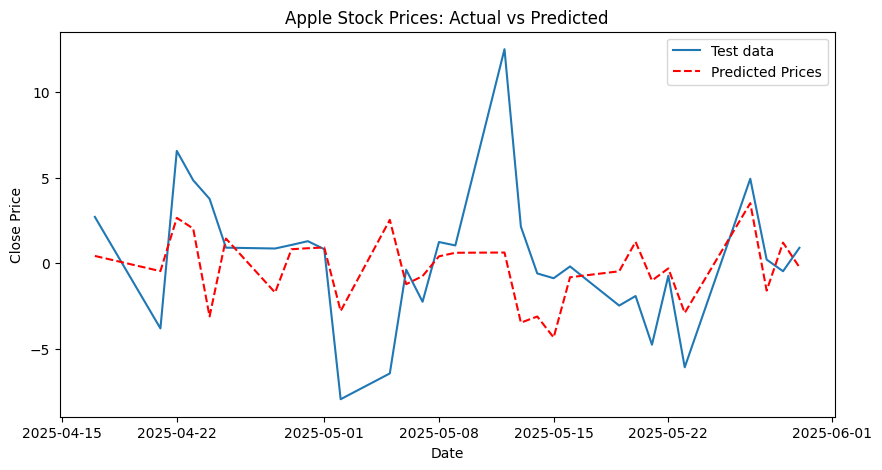

RMSE:  3.85


In [125]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt

# SARIMA parameters
p, d, q = 7, 1, 7
P, D, Q, s = 1, 1, 1, 45

# Fit the SARIMA model
model = SARIMAX(train_data, order=(p, d, q), seasonal_order=(P, D, Q, s))
model_fit = model.fit()

# Make predictions on the test data
predictions = model_fit.predict(
    start=len(train_data),
    end=len(train_data) + len(test_data) - 1,
    dynamic=False
)

# Plot the actual vs predicted values
plt.figure(figsize=(10, 5))
plt.plot(test_data.index, test_data, label='Test data')
plt.plot(test_data.index, predictions, color="red", linestyle="--", label='Predicted Prices')
plt.title('Apple Stock Prices: Actual vs Predicted')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.show()

# evaluating model using RMSE score
rmse = round(np.sqrt(mean_squared_error(test_data, predictions)),2)
print('RMSE: ',rmse)


#### Vector Models

In [126]:
import yfinance as yf
import pandas as pd
from statsmodels.tsa.stattools import grangercausalitytests

# Download TSLA and AAPL data
tsla_data = yf.download('TSLA', start='2023-01-01')
aapl_data = yf.download('AAPL', start='2023-01-01')

# Combine into one DataFrame
stock_data = pd.DataFrame()
stock_data['TSLA_Close'] = tsla_data['Close']
stock_data['AAPL_Close'] = aapl_data['Close'].shift(1)  # Shift for causality direction
stock_data.dropna(inplace=True)

# Perform Granger Causality Test
print("Granger Causality Test Results (does AAPL cause TSLA?):")
grangercausalitytests(stock_data[['TSLA_Close', 'AAPL_Close']], maxlag=[14])


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Granger Causality Test Results (does AAPL cause TSLA?):

Granger Causality
number of lags (no zero) 14
ssr based F test:         F=1.3502  , p=0.1732  , df_denom=560, df_num=14
ssr based chi2 test:   chi2=19.8812 , p=0.1339  , df=14
likelihood ratio test: chi2=19.5530 , p=0.1449  , df=14
parameter F test:         F=1.3502  , p=0.1732  , df_denom=560, df_num=14


{14: ({'ssr_ftest': (1.350167195520774, 0.173189683458976, 560.0, 14),
   'ssr_chi2test': (19.881211954043394, 0.13393124524085337, 14),
   'lrtest': (19.553039343588352, 0.14487450235597665, 14),
   'params_ftest': (1.3501671955208223, 0.1731896834589492, 560.0, 14.0)},
   array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
           0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1.,
           0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
           0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
          [0., 0., 0., 0., 0., 0.

In [128]:

# Take first differences to ensure stationarity (if needed)
data = stock_data[['AAPL_Close', 'TSLA_Close']].diff().dropna()

# Split into training and testing datasets
train_data, test_data = data[:-14], data[-14:]


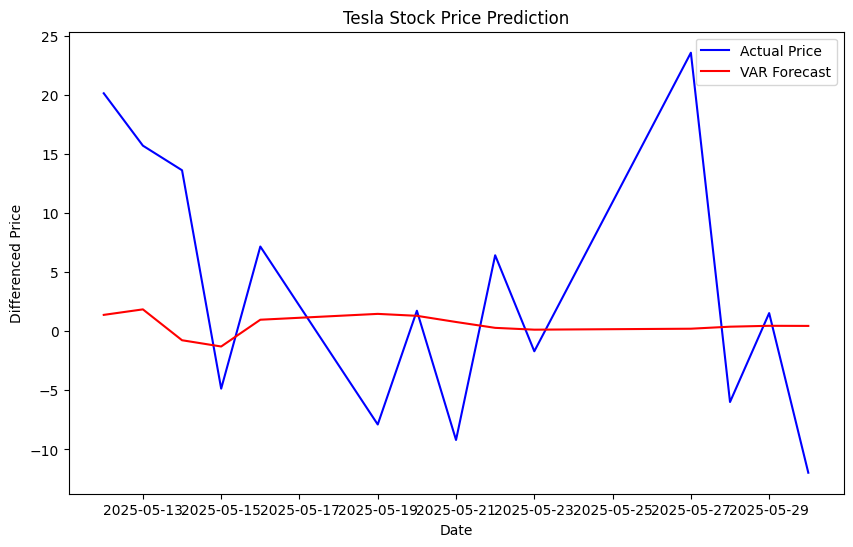

RMSE: 11.24


In [129]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.api import VAR
from sklearn.metrics import mean_squared_error

# Fit VAR model
model = VAR(train_data)
result = model.fit(maxlags=7)

# Forecast
lag_order = result.k_ar
predictions = result.forecast(train_data.values[-lag_order:], steps=len(test_data))

# Create DataFrame for predictions
predictions = pd.DataFrame(predictions, index=test_data.index, columns=test_data.columns)

# Plot actual vs predicted TSLA prices
plt.figure(figsize=(10, 6))
plt.plot(test_data.index, test_data['TSLA_Close'], label='Actual Price', color='blue')
plt.plot(test_data.index, predictions['TSLA_Close'], label='VAR Forecast', color='red')
plt.legend()
plt.title('Tesla Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Differenced Price')
plt.show()

# Evaluate the model using RMSE
rmse = round(np.sqrt(mean_squared_error(test_data['TSLA_Close'], predictions['TSLA_Close'])), 2)
print('RMSE:', rmse)


#### VARIMA

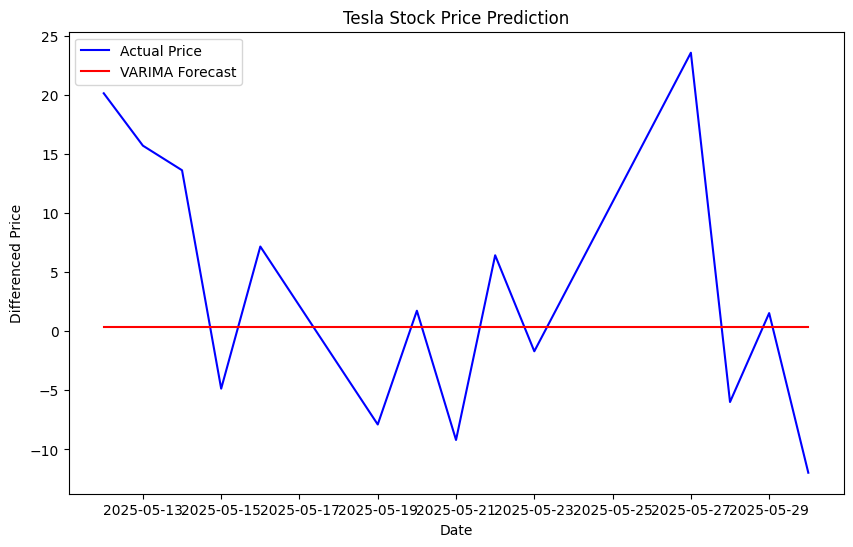

RMSE: 11.38


In [130]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.api import VARMAX
from sklearn.metrics import mean_squared_error

# Fit VARIMA model
model = VARMAX(train_data, order=(14, 14))
result = model.fit(disp=False)

# Forecasting
predictions = result.predict(
    start=len(train_data),
    end=len(train_data) + len(test_data) - 1,
    dynamic=False
)

# Align predictions index with test data
predictions.index = test_data.index

# Plotting actual vs predicted
plt.figure(figsize=(10, 6))
plt.plot(test_data.index, test_data['TSLA_Close'], label='Actual Price', color='blue')
plt.plot(test_data.index, predictions['TSLA_Close'], label='VARIMA Forecast', color='red')
plt.legend()
plt.title('Tesla Stock Price Prediction')
plt.xlabel('Date')
plt.ylabel('Differenced Price')
plt.show()

# Evaluate using RMSE
rmse = round(np.sqrt(mean_squared_error(test_data['TSLA_Close'], predictions['TSLA_Close'])), 2)
print('RMSE:', rmse)


### Smoothing Methods

[*********************100%***********************]  1 of 1 completed


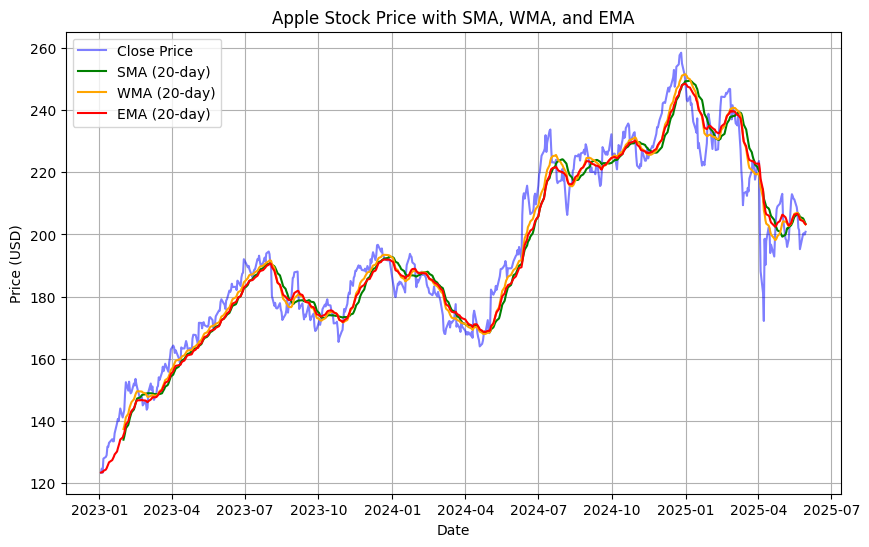

In [131]:
import numpy as np
import pandas as pd
import yfinance as yf
import matplotlib.pyplot as plt

# Download data
stock_data = yf.download('AAPL', start='2023-01-01')

# Set window size
window_size = 20

# Simple Moving Average (SMA)
stock_data['SMA'] = stock_data['Close'].rolling(window=window_size).mean()

# Weighted Moving Average (WMA)
weights = np.arange(1, window_size + 1)
stock_data['WMA'] = stock_data['Close'].rolling(window=window_size).apply(
    lambda prices: np.dot(prices, weights) / weights.sum(), raw=True
)

# Exponential Moving Average (EMA)
stock_data['EMA'] = stock_data['Close'].ewm(span=window_size, adjust=False).mean()

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(stock_data['Close'], label='Close Price', color='blue', alpha=0.5)
plt.plot(stock_data['SMA'], label=f'SMA ({window_size}-day)', color='green')
plt.plot(stock_data['WMA'], label=f'WMA ({window_size}-day)', color='orange')
plt.plot(stock_data['EMA'], label=f'EMA ({window_size}-day)', color='red')
plt.title('Apple Stock Price with SMA, WMA, and EMA')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.legend()
plt.grid(True)
plt.show()


[*********************100%***********************]  1 of 1 completed


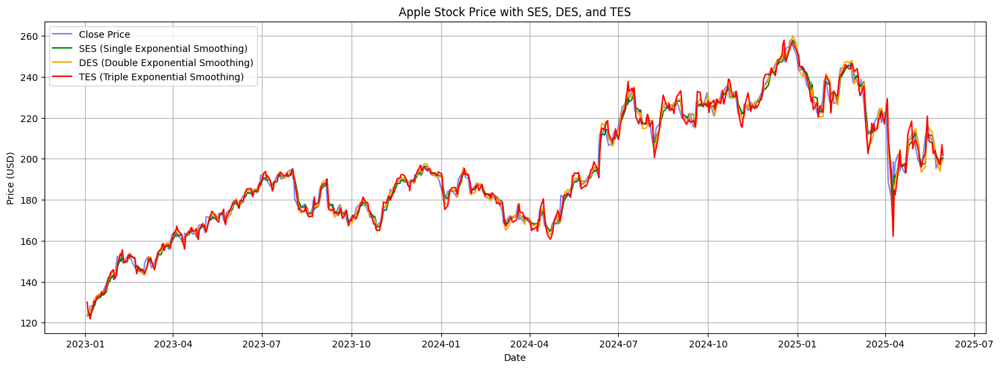

In [132]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf
from statsmodels.tsa.holtwinters import SimpleExpSmoothing, ExponentialSmoothing

# Download Apple stock data
stock_data = yf.download('AAPL', start='2023-01-01')
close_prices = stock_data['Close']

# Simple Exponential Smoothing (SES)
ses_model = SimpleExpSmoothing(close_prices).fit(smoothing_level=0.7, optimized=False)
stock_data['SES'] = ses_model.fittedvalues

# Double Exponential Smoothing (DES)
des_model = ExponentialSmoothing(close_prices, trend='add').fit(smoothing_level=0.7, smoothing_slope=0.3, optimized=False)
stock_data['DES'] = des_model.fittedvalues

# Triple Exponential Smoothing (TES) - Holt-Winters
tes_model = ExponentialSmoothing(close_prices, trend='add', seasonal='add', seasonal_periods=12).fit(
    smoothing_level=0.7, smoothing_trend=0.3, smoothing_seasonal=0.2, optimized=False
)
stock_data['TES'] = tes_model.fittedvalues

# Plotting
plt.figure(figsize=(18, 6))
plt.plot(stock_data['Close'], label='Close Price', color='blue', alpha=0.5)
plt.plot(stock_data['SES'], label='SES (Single Exponential Smoothing)', color='green')
plt.plot(stock_data['DES'], label='DES (Double Exponential Smoothing)', color='orange')
plt.plot(stock_data['TES'], label='TES (Triple Exponential Smoothing)', color='red')
plt.title('Apple Stock Price with SES, DES, and TES')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.legend()
plt.grid(True)
plt.show()


#### ACF and PACF Plot

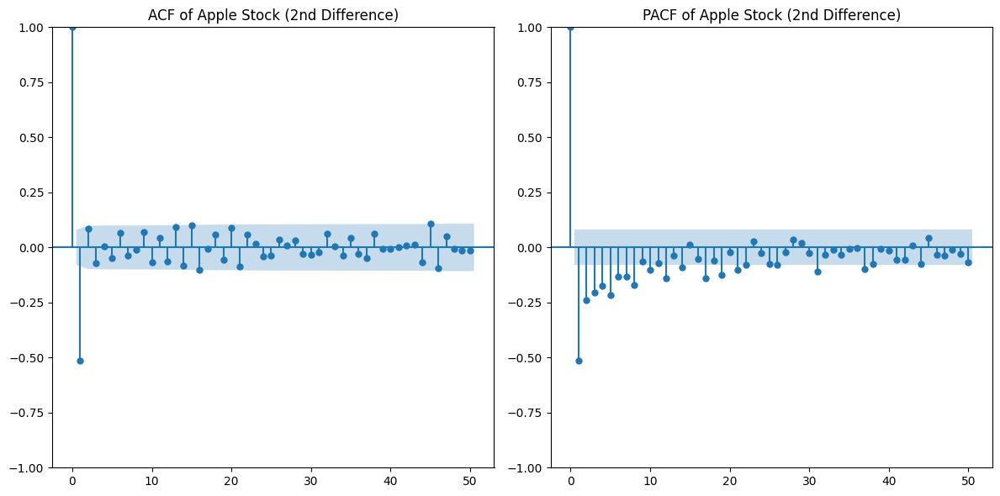

In [133]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# ACF Plot
plt.subplot(1, 2, 1)
plot_acf(stock_data['Close'].diff().diff().dropna(), ax=plt.gca(), lags=50)
plt.title('ACF of Apple Stock (2nd Difference)')

# PACF Plot
plt.subplot(1, 2, 2)
plot_pacf(stock_data['Close'].diff().diff().dropna(), ax=plt.gca(), lags=50, method='ywm')
plt.title('PACF of Apple Stock (2nd Difference)')

plt.tight_layout()
plt.show()


### Model Evaluation Metrics

In [134]:
# Correct train-test split: train is all but last 30, test is the last 30
train_data, test_data = apple_price_stationary[:-30], apple_price_stationary[-30:]

# Fit the Autoregressive model (AR) to the training data
model = AutoReg(train_data, lags=30)
model_fit = model.fit()

# Make predictions on the test data
predictions = model_fit.predict(
    start=len(train_data),
    end=len(train_data) + len(test_data) - 1,
    dynamic=False
)


In [135]:
from sklearn.metrics import mean_absolute_error, mean_squared_error
import numpy as np

# 1. Mean Absolute Error (MAE)
mae = mean_absolute_error(test_data, predictions)
print(f'Mean Absolute Error (MAE): {mae}')

# 2. Mean Squared Error (MSE)
mse = mean_squared_error(test_data, predictions)
print(f'Mean Squared Error (MSE): {mse}')

# 3. Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse}')

# 4. Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((np.array(test_data) - np.array(predictions)) / np.array(test_data))) * 100
print(f'Mean Absolute Percentage Error (MAPE): {mape}%')

# AIC and BIC
aic = model_fit.aic
bic = model_fit.bic
print(f'Akaike Information Criterion (AIC): {aic}')
print(f'Bayesian Information Criterion (BIC): {bic}')


Mean Absolute Error (MAE): 3.4088378606569254
Mean Squared Error (MSE): 18.497712286157316
Root Mean Squared Error (RMSE): 4.300896683966881
Mean Absolute Percentage Error (MAPE): 233.67903727251712%
Akaike Information Criterion (AIC): 2851.7756688564978
Bayesian Information Criterion (BIC): 2989.2831670943838


In [137]:
# Correct train-test split: train is all but last 30, test is the last 30
train_data, test_data = apple_price_stationary[:-30], apple_price_stationary[-30:]

# Fit the Autoregressive model (AR) to the training data
model = AutoReg(train_data, lags=20)
model_fit = model.fit()

# Make predictions on the test data
predictions = model_fit.predict(
    start=len(train_data),
    end=len(train_data) + len(test_data) - 1,
    dynamic=False
)

# 1. Mean Absolute Error (MAE)
mae = mean_absolute_error(test_data, predictions)
print(f'Mean Absolute Error (MAE): {mae}')

# 2. Mean Squared Error (MSE)
mse = mean_squared_error(test_data, predictions)
print(f'Mean Squared Error (MSE): {mse}')

# 3. Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse}')

# 4. Mean Absolute Percentage Error (MAPE)
mape = np.mean(np.abs((np.array(test_data) - np.array(predictions)) / np.array(test_data))) * 100
print(f'Mean Absolute Percentage Error (MAPE): {mape}%')

# AIC and BIC
aic = model_fit.aic
bic = model_fit.bic
print(f'Akaike Information Criterion (AIC): {aic}')
print(f'Bayesian Information Criterion (BIC): {bic}')


Mean Absolute Error (MAE): 2.9225730646572354
Mean Squared Error (MSE): 15.348443323870947
Root Mean Squared Error (RMSE): 3.9177089381258208
Mean Absolute Percentage Error (MAPE): 185.11978386072317%
Akaike Information Criterion (AIC): 2897.259891917539
Bayesian Information Criterion (BIC): 2992.19776795103


### Resampling

In [138]:
import pandas as pd

# Correctly define the data dictionary
data = {
    'Date': ['2024-01-01', '2024-01-02', '2024-01-04', '2024-01-07',
             '2024-01-08', '2024-01-09', '2024-01-10', '2024-01-12'],
    'Price': [100, 101, 103, 106, 107, 108, 109, 111]
}

# Create a DataFrame
df = pd.DataFrame(data)

# Convert 'Date' to datetime and set it as index
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

# Display the DataFrame
df


,Price
Date,
2024-01-01,100
2024-01-02,101
2024-01-04,103
2024-01-07,106
2024-01-08,107
2024-01-09,108
2024-01-10,109
2024-01-12,111


In [139]:
# Create a complete date range
complete_index = pd.date_range(start='2024-01-01', end='2024-01-12', freq='D')

# Reindex the DataFrame to include all dates, filling missing dates with NaN
df = df.reindex(complete_index)

# Optionally rename the index
df.index.name = 'Date'

print("Reindexed DataFrame with Missing Dates:\n", df)


Reindexed DataFrame with Missing Dates:
             Price
Date             
2024-01-01  100.0
2024-01-02  101.0
2024-01-03    NaN
2024-01-04  103.0
2024-01-05    NaN
2024-01-06    NaN
2024-01-07  106.0
2024-01-08  107.0
2024-01-09  108.0
2024-01-10  109.0
2024-01-11    NaN
2024-01-12  111.0


#### 1. Imputation

In [141]:
# Mean Imputation
mean_value = df.mean()
data_mean_imputed = df.fillna(mean_value)

# Median Imputation
median_value = df.median()
data_median_imputed = df.fillna(median_value)

# Mode Imputation
mode_value = df.mode()
data_mode_imputed = df.fillna(mode_value.iloc[0])

# Forward Fill
data_ffill = df.ffill()

# Backward Fill
data_bfill = df.bfill()

print("Original Data:\n", df)

# Mean
print("\n--\nMean:", mean_value.values[0])
print("---\nMean Imputation:\n", data_mean_imputed)

# Median
print("\n--\nMedian:", median_value.values[0])
print("---\nMedian Imputation:\n", data_median_imputed)

# Mode
print("\n--\nMode:", mode_value.values[0][0])
print("---\nMode Imputation:\n", data_mode_imputed)

# Forward Fill
print("\n--\nForward Fill:\n", data_ffill)

# Backward Fill
print("\n--\nBackward Fill:\n", data_bfill)


Original Data:
             Price
Date             
2024-01-01  100.0
2024-01-02  101.0
2024-01-03    NaN
2024-01-04  103.0
2024-01-05    NaN
2024-01-06    NaN
2024-01-07  106.0
2024-01-08  107.0
2024-01-09  108.0
2024-01-10  109.0
2024-01-11    NaN
2024-01-12  111.0

--
Mean: 105.625
---
Mean Imputation:
               Price
Date               
2024-01-01  100.000
2024-01-02  101.000
2024-01-03  105.625
2024-01-04  103.000
2024-01-05  105.625
2024-01-06  105.625
2024-01-07  106.000
2024-01-08  107.000
2024-01-09  108.000
2024-01-10  109.000
2024-01-11  105.625
2024-01-12  111.000

--
Median: 106.5
---
Median Imputation:
             Price
Date             
2024-01-01  100.0
2024-01-02  101.0
2024-01-03  106.5
2024-01-04  103.0
2024-01-05  106.5
2024-01-06  106.5
2024-01-07  106.0
2024-01-08  107.0
2024-01-09  108.0
2024-01-10  109.0
2024-01-11  106.5
2024-01-12  111.0

--
Mode: 100.0
---
Mode Imputation:
             Price
Date             
2024-01-01  100.0
2024-01-02  101.0
2024-01-

#### 2. Interpolation

In [142]:
# Linear Interpolation
data_linear_interp = df.interpolate(method='linear')

# Polynomial Interpolation (degree 2)
data_poly_interp = df.interpolate(method='polynomial', order=2)

# Spline Interpolation (order 2)
data_spline_interp = df.interpolate(method='spline', order=2)

# Print the results
print("\nLinear Interpolation:\n", data_linear_interp)
print("\nPolynomial Interpolation (degree 2):\n", data_poly_interp)
print("\nSpline Interpolation (order 2):\n", data_spline_interp)



Linear Interpolation:
             Price
Date             
2024-01-01  100.0
2024-01-02  101.0
2024-01-03  102.0
2024-01-04  103.0
2024-01-05  104.0
2024-01-06  105.0
2024-01-07  106.0
2024-01-08  107.0
2024-01-09  108.0
2024-01-10  109.0
2024-01-11  110.0
2024-01-12  111.0

Polynomial Interpolation (degree 2):
             Price
Date             
2024-01-01  100.0
2024-01-02  101.0
2024-01-03  102.0
2024-01-04  103.0
2024-01-05  104.0
2024-01-06  105.0
2024-01-07  106.0
2024-01-08  107.0
2024-01-09  108.0
2024-01-10  109.0
2024-01-11  110.0
2024-01-12  111.0

Spline Interpolation (order 2):
             Price
Date             
2024-01-01  100.0
2024-01-02  101.0
2024-01-03  102.0
2024-01-04  103.0
2024-01-05  104.0
2024-01-06  105.0
2024-01-07  106.0
2024-01-08  107.0
2024-01-09  108.0
2024-01-10  109.0
2024-01-11  110.0
2024-01-12  111.0


In [143]:
import pandas as pd

# Create the DataFrame
data = pd.DataFrame({
    'Sales': [700, 900, 1000, 2000, 1500, 3000, 2300, 4800, 5900, 6000, 65000, 7800]
})

# Display the DataFrame
print(data)


    Sales
0     700
1     900
2    1000
3    2000
4    1500
5    3000
6    2300
7    4800
8    5900
9    6000
10  65000
11   7800


In [146]:
import pandas as pd
from sklearn.linear_model import LinearRegression

# Sample price data with some missing values
df = pd.DataFrame({
    'Price': [100, 101, None, 103, None, 106, 107, None, 109, None, None, 111]
})

# Add sales data
df['Sales'] = [700, 900, 1000, 2000, 1500, 3000, 2300, 4800, 5900, 6000, 65000, 7800]

# Split known and missing data
known_data = df.dropna(subset=['Price'])
missing_data = df[df['Price'].isna()]

# Train a model on known data
model = LinearRegression()
model.fit(known_data[['Sales']], known_data['Price'])  # Use double brackets for 2D input

# Predict missing values
predicted_values = model.predict(missing_data[['Sales']])

# Fill in the predicted values
df.loc[df['Price'].isna(), 'Price'] = predicted_values

# Show the updated DataFrame
print("\nData with Predicted Values:\n", df)




Data with Predicted Values:
          Price  Sales
0   100.000000    700
1   101.000000    900
2   102.099351   1000
3   103.000000   2000
4   102.814240   1500
5   106.000000   3000
6   107.000000   2300
7   107.532509   4800
8   109.000000   5900
9   109.248243   6000
10  193.605164  65000
11  111.000000   7800


#### Resampling

In [147]:
# Downsample to monthly frequency, taking the mean of 'Close' prices
monthly_data = stock_data['Close'].resample('M').mean()

# Display the result
print("\nMonthly Downsampled Data:\n", monthly_data)



Monthly Downsampled Data:
 Ticker            AAPL
Date                  
2023-01-31  134.042665
2023-02-28  149.181326
2023-03-31  153.216693
2023-04-30  163.183974
2023-05-31  170.815939
2023-06-30  182.456530
2023-07-31  190.504114
2023-08-31  179.445128
2023-09-30  175.484521
2023-10-31  173.170672
2023-11-30  184.450169
2023-12-31  192.895895
2024-01-31  186.359549
2024-02-29  183.594861
2024-03-31  171.659779
2024-04-30  168.586382
2024-05-31  185.341722
2024-06-30  205.303019
2024-07-31  223.553149
2024-08-31  220.783581
2024-09-30  222.974217
2024-10-31  229.250243
2024-11-30  227.200960
2024-12-31  248.722870
2025-01-31  234.022475
2025-02-28  238.134693
2025-03-31  222.411198
2025-04-30  200.920336
2025-05-31  203.859314


In [148]:
# Upsample to hourly frequency and interpolate missing values linearly
hourly_data = stock_data['Close'].resample('H').interpolate(method='linear')

# Display the result
print("\nHourly Upsampled Data:\n", hourly_data)



Hourly Upsampled Data:
 Ticker                     AAPL
Date                           
2023-01-03 00:00:00  123.470627
2023-01-03 01:00:00  123.523689
2023-01-03 02:00:00  123.576752
2023-01-03 03:00:00  123.629814
2023-01-03 04:00:00  123.682877
...                         ...
2025-05-29 20:00:00  200.700005
2025-05-29 21:00:00  200.737505
2025-05-29 22:00:00  200.775005
2025-05-29 23:00:00  200.812506
2025-05-30 00:00:00  200.850006

[21073 rows x 1 columns]


## Test 2


### 1. Packages import, Data Collection, Data Processing

In [187]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose, STL
from statsmodels.tsa.arima.model import ARIMA

In [159]:
# Set time range
years = 15
endDate = dt.datetime.now()
startDate = endDate - dt.timedelta(days=365 * years)

# Download data
assets = ["SPY"]
df = yf.download(assets, start=startDate, end=endDate, auto_adjust=False)["Adj Close"]

[*********************100%***********************]  1 of 1 completed


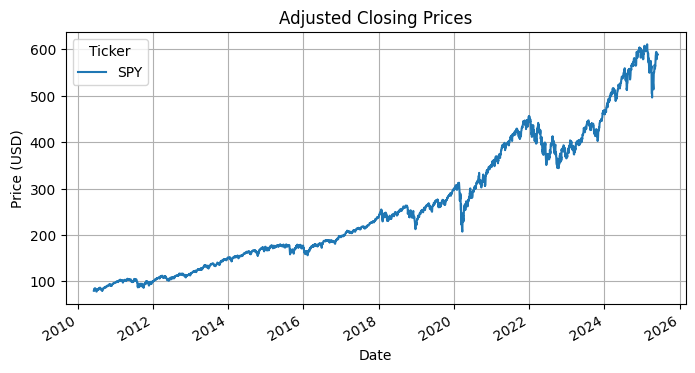

In [160]:
df.plot(figsize=(8, 4), title="Adjusted Closing Prices")
plt.xlabel("Date")
plt.ylabel("Price (USD)")
plt.grid(True)
plt.show()


In [161]:
# Check for missing values
missing = df.isnull().sum()
print("Missing values before fill:\n", missing)

# Forward fill
df_filled = df.ffill()

# Confirm no missing values
print("Missing values after fill:\n", df_filled.isnull().sum())


Missing values before fill:
 Ticker
SPY    0
dtype: int64
Missing values after fill:
 Ticker
SPY    0
dtype: int64


In [164]:
# Calculate mean and standard deviation
mean = df_filled.mean()
std = df_filled.std()

# Calculate Z-score for each point
z_scores = (df_filled - mean) / std

# Set threshold (e.g., |z| > 3)
outliers_z = df_filled[np.abs(z_scores) > 3]

# Show outlier dates and values
print("Outliers based on Z-score:\n", outliers_z.dropna())

Outliers based on Z-score:
 Empty DataFrame
Columns: [SPY]
Index: []


In [169]:
# Define rolling window size
window = 10  # e.g., 30-day rolling window

# Calculate rolling mean and standard deviation
rolling_mean = df_filled.rolling(window).mean()
rolling_std = df_filled.rolling(window).std()

# Define dynamic threshold: |value - rolling_mean| > 3 * rolling_std
outliers_rolling = df_filled[(np.abs(df_filled - rolling_mean) > 3 * rolling_std)]

# Show detected outliers
print("Outliers based on rolling statistics:\n", outliers_rolling.dropna())


Outliers based on rolling statistics:
 Empty DataFrame
Columns: [SPY]
Index: []


### 2. Exploratory Data Analysis (EDA)

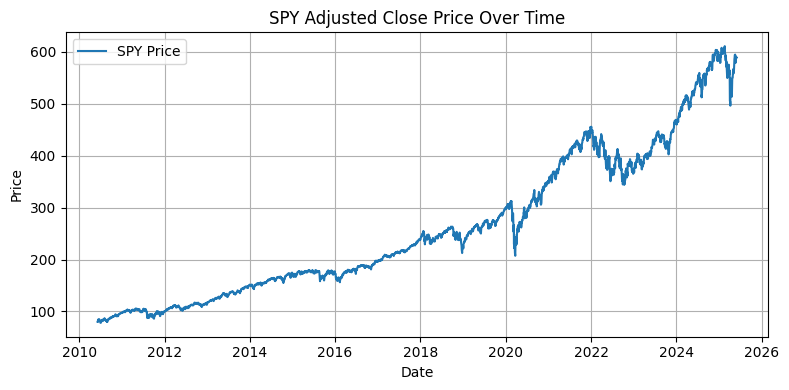

Basic Descriptive Statistics:

Ticker          SPY
count   3770.000000
mean     261.325135
std      140.018111
min       78.033241
25%      151.982750
50%      228.269920
75%      379.601234
max      611.091675

Mean: 261.33
Variance: 19605.07


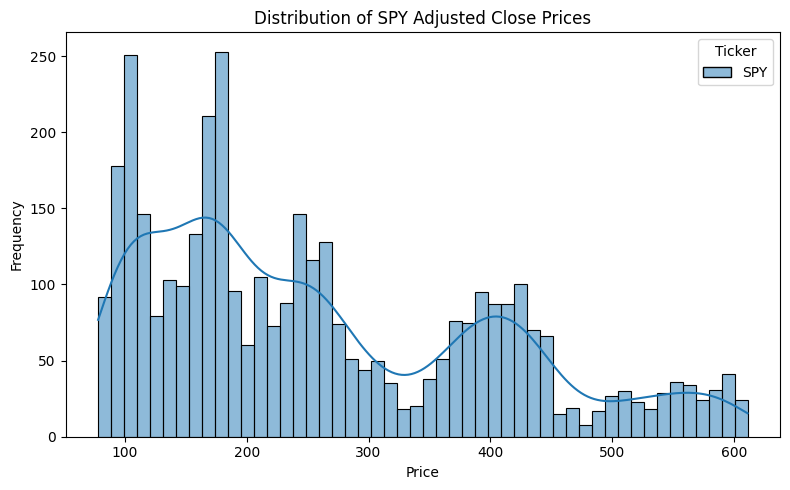

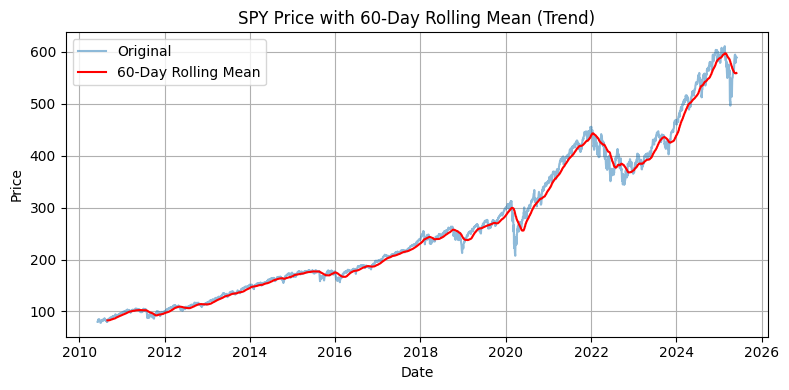

In [171]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Make sure datetime index is properly set
df = df.copy()
df.index = pd.to_datetime(df.index)

# --- 1. Time Series Plot ---
plt.figure(figsize=(8, 4))
plt.plot(df, label='SPY Price')
plt.title("SPY Adjusted Close Price Over Time")
plt.xlabel("Date")
plt.ylabel("Price")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

# --- 2. Basic Statistics ---
print("Basic Descriptive Statistics:\n")
print(df.describe())

mean_val = df.mean().values[0]
var_val = df.var().values[0]
print(f"\nMean: {mean_val:.2f}")
print(f"Variance: {var_val:.2f}")

# --- 3. Distribution Plot ---
plt.figure(figsize=(8, 5))
sns.histplot(df, bins=50, kde=True)
plt.title("Distribution of SPY Adjusted Close Prices")
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()

# --- 4. Plot Rolling Mean (Trend) ---
rolling_window = 60  # ~3 months
df_rolling = df.rolling(window=rolling_window).mean()

plt.figure(figsize=(8, 4))
plt.plot(df, label='Original', alpha=0.5)
plt.plot(df_rolling, label=f'{rolling_window}-Day Rolling Mean', color='red')
plt.title(f"SPY Price with {rolling_window}-Day Rolling Mean (Trend)")
plt.xlabel("Date")
plt.ylabel("Price")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


#### conclusion from the distribution plot

- SPY prices have not remained stationary - the changing levels suggest trend and regime shifts.
- The price distribution is positively skewed and multimodal, indicating non-normal behavior and market cycles.
- You should likely analyze log returns or differenced data for stationarity or modeling.

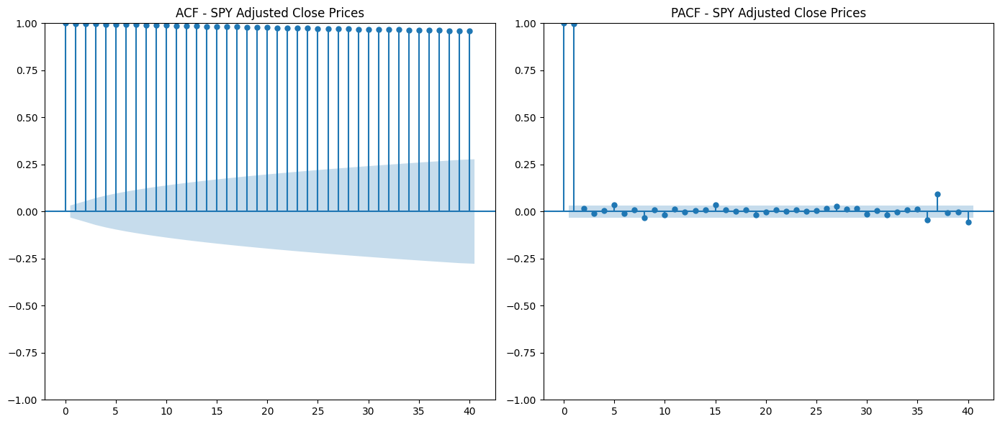

In [173]:
df = df.ffill()

# --- Plot ACF and PACF on raw data (Adjusted Close prices) ---
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plot_acf(df, lags=40, ax=plt.gca(), title='ACF - SPY Adjusted Close Prices')

plt.subplot(1, 2, 2)
plot_pacf(df, lags=40, ax=plt.gca(), title='PACF - SPY Adjusted Close Prices', method='ywm')

plt.tight_layout()
plt.show()

#### conclusion

- The PACF suggests that if you difference the data, an AR(1) or AR(2) model may be a good starting point.
- But you should confirm this with ACF/PACF on differenced data.

#### Lets try on log return

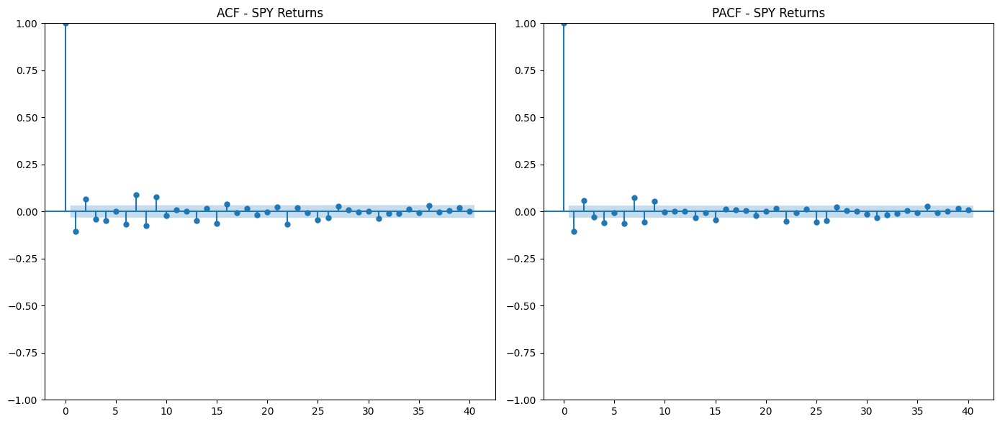

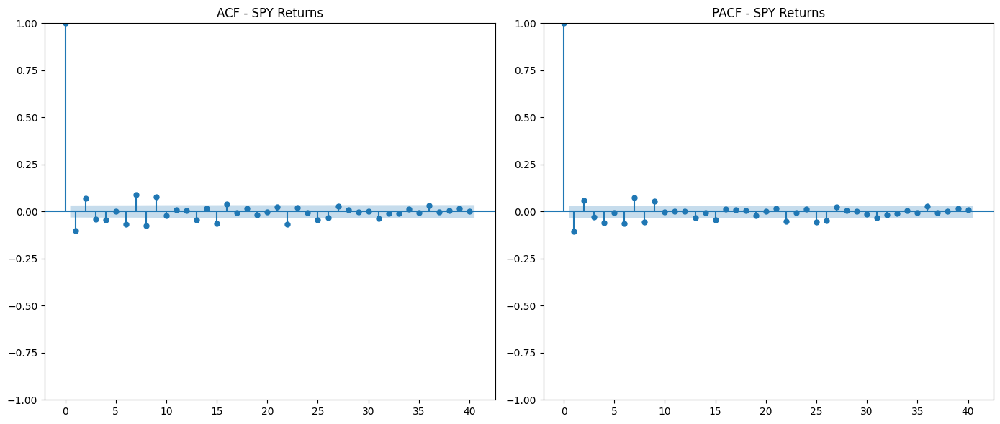

In [179]:
# --- Step 3: Calculate Log Returns (stationarity assumption) ---
returns = df.pct_change().dropna()  # you can use np.log(df).diff() for log returns
returns2 = np.log(df).diff().dropna()

# --- Step 4: Plot ACF and PACF ---
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plot_acf(returns, lags=40, ax=plt.gca(), title='ACF - SPY Returns')
plt.subplot(1, 2, 2)
plot_pacf(returns, lags=40, ax=plt.gca(), title='PACF - SPY Returns', method='ywm')  # 'ywm' is more stable for large data
plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plot_acf(returns2, lags=40, ax=plt.gca(), title='ACF - SPY Returns')
plt.subplot(1, 2, 2)
plot_pacf(returns, lags=40, ax=plt.gca(), title='PACF - SPY Returns', method='ywm')  # 'ywm' is more stable for large data
plt.tight_layout()
plt.show()

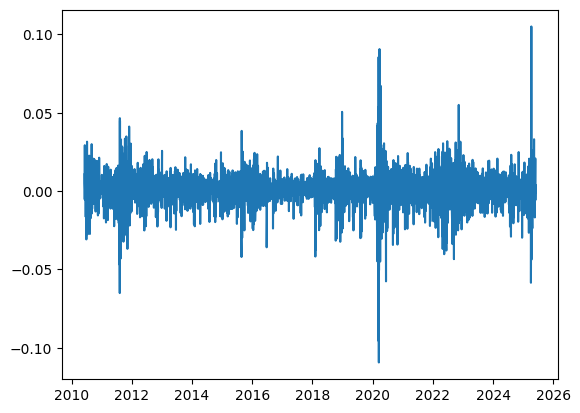

In [176]:
plt.plot(returns)

### 3. Time Series Decomposition

In [180]:
# Ensure datetime index
df = df.dropna()
df.index = pd.to_datetime(df.index)

# Resample to monthly average for smoother decomposition
monthly_df = df['SPY'].resample('M').mean()



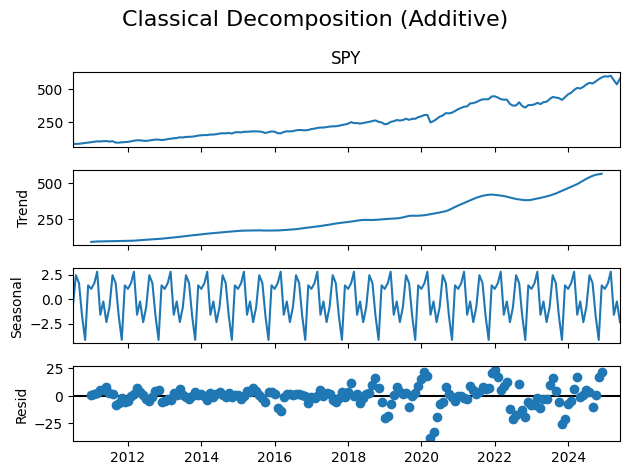

In [182]:
# Classical Additive Decomposition
decomp_result = seasonal_decompose(monthly_df, model='additive', period=12)

# Plot decomposition
decomp_result.plot()
plt.suptitle('Classical Decomposition (Additive)', fontsize=16)
plt.tight_layout()
plt.show()


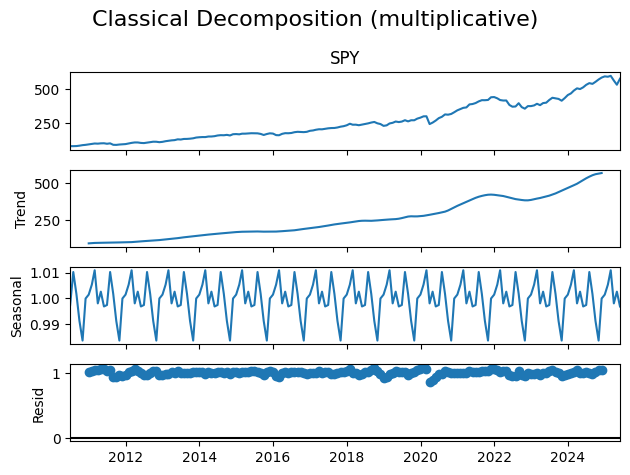

In [185]:
# Classical Additive Decomposition
decomp_result = seasonal_decompose(monthly_df, model='multiplicative', period=12)

# Plot decomposition
decomp_result.plot()
plt.suptitle('Classical Decomposition (multiplicative)', fontsize=16)
plt.tight_layout()
plt.show()

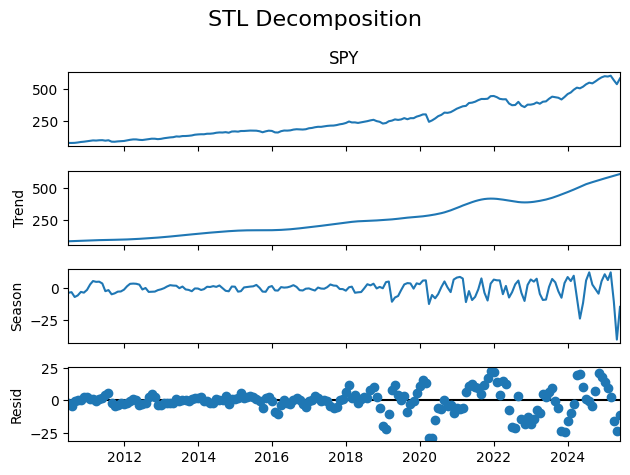

In [183]:
# STL decomposition
stl = STL(monthly_df, period=12)
stl_result = stl.fit()

# Plot STL decomposition
stl_result.plot()
plt.suptitle('STL Decomposition', fontsize=16)
plt.tight_layout()
plt.show()


### 4. Stationarity Check

In [188]:
# ADF Test
adf_result = adfuller(df)
print("ADF Test:")
print(f"  Test Statistic: {adf_result[0]}")
print(f"  p-value: {adf_result[1]}")
print("  Critical Values:")
for k, v in adf_result[4].items():
    print(f"    {k}: {v}")
print()

# KPSS Test
kpss_stat, kpss_pval, _, kpss_crit = kpss(df, regression='c', nlags='auto')
print("KPSS Test:")
print(f"  Test Statistic: {kpss_stat}")
print(f"  p-value: {kpss_pval}")
print("  Critical Values:")
for k, v in kpss_crit.items():
    print(f"    {k}: {v}")
print()

ADF Test:
  Test Statistic: 1.0787412271452002
  p-value: 0.9950310408030167
  Critical Values:
    1%: -3.4321001457923326
    5%: -2.8623133177995204
    10%: -2.5671816478390994

KPSS Test:
  Test Statistic: 9.014495668577014
  p-value: 0.01
  Critical Values:
    10%: 0.347
    5%: 0.463
    2.5%: 0.574
    1%: 0.739



| Test | Null Hypothesis | Alternative Hypothesis | Stationarity Decision |
| :--- | :--- | :--- | :--- |
| ADF (Augmented DickeyFuller) | Series has a unit root (non-stationary) | Series is stationary | p-value $<0.05 \rightarrow$ Stationary |
| KPSS | Series is stationary | Series is non-stationary | p-value $<0.05 \rightarrow$ NonStationary |
| Phillips-Perron | Series has a unit root (non-stationary) | Series is stationary | p-value $<0.05 \rightarrow$ Stationary |

### 5. Make Series Stationary (if needed)

In [189]:
# ----------------------
# 1. ADF test function
# ----------------------
def adf_test(series, title=""):
    print(f"\nADF Test for: {title}")
    result = adfuller(series.dropna(), autolag='AIC')
    labels = ['ADF Statistic', 'p-value', '# Lags Used', '# Observations']
    out = pd.Series(result[0:4], index=labels)
    for key, val in result[4].items():
        out[f'Critical Value ({key})'] = val
    print(out)
    if result[1] <= 0.05:
        print("=> Stationary (Reject H0)")
    else:
        print("=> Non-Stationary (Fail to Reject H0)")
    return out




ADF Test for: Original
ADF Statistic              1.078741
p-value                    0.995031
# Lags Used               30.000000
# Observations          3739.000000
Critical Value (1%)       -3.432100
Critical Value (5%)       -2.862313
Critical Value (10%)      -2.567182
dtype: float64
=> Non-Stationary (Fail to Reject H0)


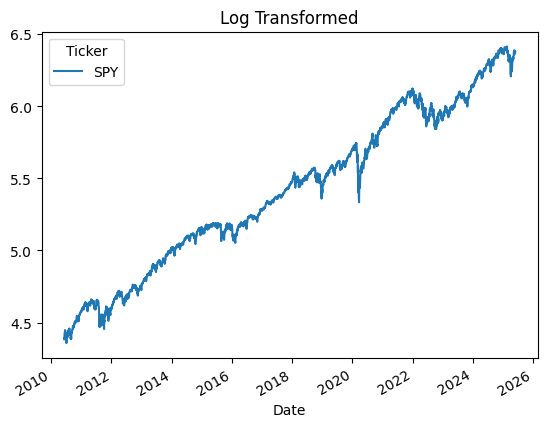


ADF Test for: Log Transformed
ADF Statistic             -0.651720
p-value                    0.858862
# Lags Used               27.000000
# Observations          3742.000000
Critical Value (1%)       -3.432099
Critical Value (5%)       -2.862313
Critical Value (10%)      -2.567181
dtype: float64
=> Non-Stationary (Fail to Reject H0)


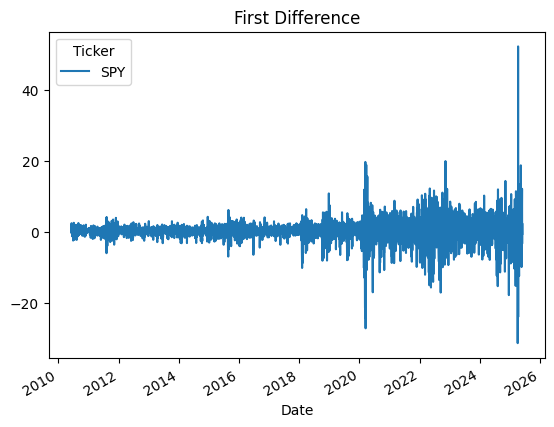


ADF Test for: 1st Difference
ADF Statistic          -1.231629e+01
p-value                 6.910018e-23
# Lags Used             2.900000e+01
# Observations          3.739000e+03
Critical Value (1%)    -3.432100e+00
Critical Value (5%)    -2.862313e+00
Critical Value (10%)   -2.567182e+00
dtype: float64
=> Stationary (Reject H0)


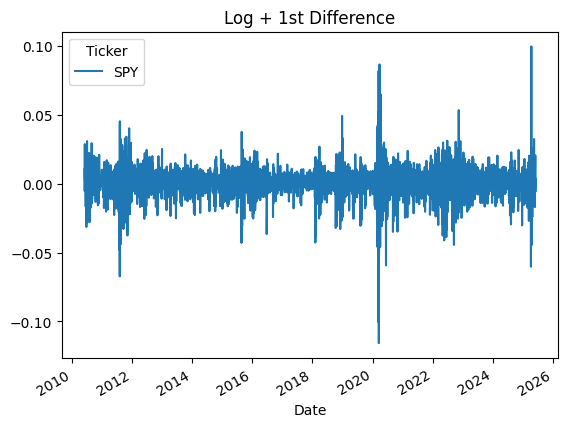


ADF Test for: Log + 1st Difference
ADF Statistic          -1.340291e+01
p-value                 4.529114e-25
# Lags Used             2.600000e+01
# Observations          3.742000e+03
Critical Value (1%)    -3.432099e+00
Critical Value (5%)    -2.862313e+00
Critical Value (10%)   -2.567181e+00
dtype: float64
=> Stationary (Reject H0)
Data shape: (3770,)


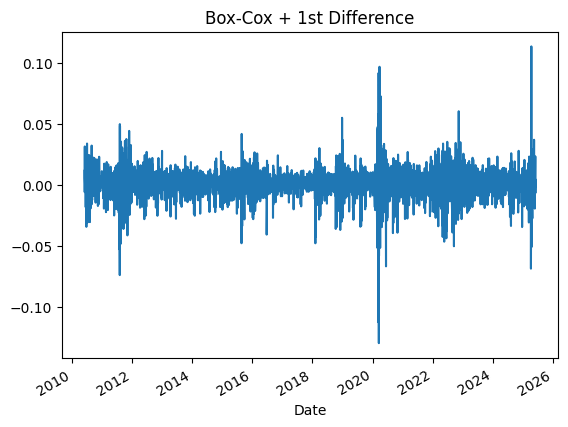


ADF Test for: Box-Cox + 1st Difference
ADF Statistic          -1.338675e+01
p-value                 4.856107e-25
# Lags Used             2.600000e+01
# Observations          3.742000e+03
Critical Value (1%)    -3.432099e+00
Critical Value (5%)    -2.862313e+00
Critical Value (10%)   -2.567181e+00
dtype: float64
=> Stationary (Reject H0)


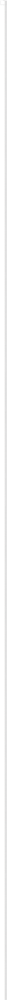


ADF Test for: Detrended


ValueError: x is required to have ndim 1 but has ndim 2

In [195]:
# ADF on original
adf_test(df, title="Original")

# ----------------------
# 3. Log Transform
# ----------------------
log_df = np.log(df)
log_df.plot(title="Log Transformed")
plt.show()
adf_test(log_df, title="Log Transformed")

# ----------------------
# 4. Differencing
# ----------------------
diff_df = df.diff()
diff_df.plot(title="First Difference")
plt.show()
adf_test(diff_df, title="1st Difference")

# ----------------------
# 5. Log + Difference
# ----------------------
log_diff = log_df.diff()
log_diff.plot(title="Log + 1st Difference")
plt.show()
adf_test(log_diff, title="Log + 1st Difference")

# ----------------------
# 6. Box-Cox + Difference (Fixed)
# ----------------------
from scipy.stats import boxcox
# Filter out only positive values and drop NaNs
df_positive = df[df > 0].dropna()
# ✅ Convert to a 1D float array
data_1d = df_positive.values.squeeze()
# Confirm shape
print("Data shape:", data_1d.shape)  # Should be (N,) — not (N, 1)
# Apply Box-Cox transformation
boxcox_transformed, lmbda = boxcox(data_1d)
# Create a Series with same index
boxcox_series = pd.Series(boxcox_transformed, index=df_positive.index)
# First difference
boxcox_diff = boxcox_series.diff()
# Plot and run ADF
boxcox_diff.plot(title="Box-Cox + 1st Difference")
plt.show()
adf_test(boxcox_diff, title="Box-Cox + 1st Difference")

# ----------------------
# 7. Detrending (linear)
# ----------------------
from statsmodels.api import OLS, add_constant

def detrend(series):
    x = np.arange(len(series))
    x_const = add_constant(x)
    # Fit OLS model
    model = OLS(series.values, x_const).fit()
    # Predict trend and wrap as Series with matching index
    trend = pd.Series(model.predict(x_const), index=series.index)
    # Subtract trend
    detrended = series - trend
    return detrended

detrended = detrend(df.dropna())
detrended.plot(title="Detrended Series")
plt.show()
adf_test(detrended, title="Detrended")

# ----------------------
# 8. Seasonal Differencing (e.g. 252-day diff for annual seasonality)
# ----------------------
seasonal_diff = df.diff(252)
seasonal_diff.plot(title="Seasonal Difference (252 Days)")
plt.show()
adf_test(seasonal_diff, title="Seasonal Difference (252 Days)")

### 6. Model Selection and Fitting

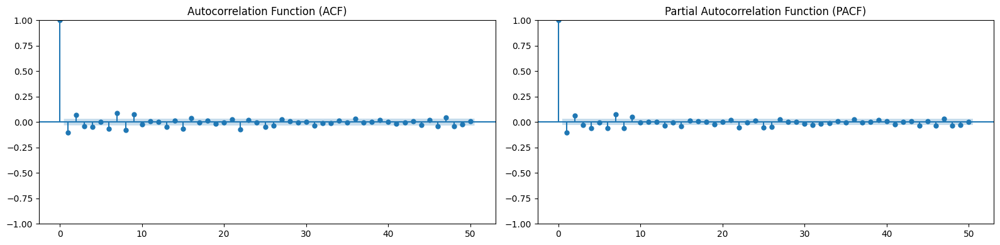

In [196]:
# Plot ACF and PACF for log_diff
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# Autocorrelation Function
plot_acf(log_diff.dropna(), ax=axes[0], lags=50)
axes[0].set_title("Autocorrelation Function (ACF)")

# Partial Autocorrelation Function
plot_pacf(log_diff.dropna(), ax=axes[1], lags=50, method='ywm')  # 'ywm' is stable and preferred for long lags
axes[1].set_title("Partial Autocorrelation Function (PACF)")

plt.tight_layout()
plt.show()

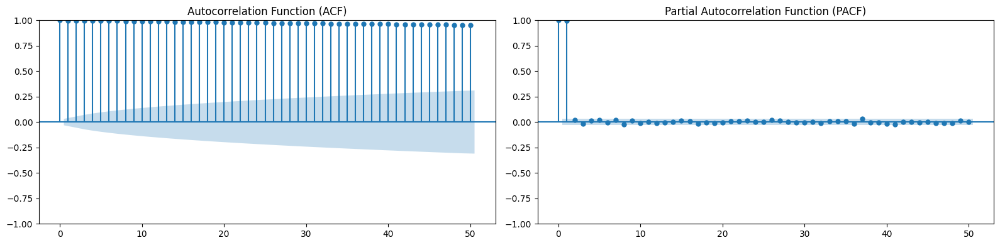

In [197]:
# Plot ACF and PACF for log_diff
fig, axes = plt.subplots(1, 2, figsize=(16, 4))

# Autocorrelation Function
plot_acf(log_df.dropna(), ax=axes[0], lags=50)
axes[0].set_title("Autocorrelation Function (ACF)")

# Partial Autocorrelation Function
plot_pacf(log_df.dropna(), ax=axes[1], lags=50, method='ywm')  # 'ywm' is stable and preferred for long lags
axes[1].set_title("Partial Autocorrelation Function (PACF)")

plt.tight_layout()
plt.show()

### 7. Model Diagnostics

In [198]:
model = ARIMA(log_diff, order=(1, 1, 0))
result = model.fit()

# Summary of the model
print(result.summary())

                               SARIMAX Results                                
Dep. Variable:                    SPY   No. Observations:                 3770
Model:                 ARIMA(1, 1, 0)   Log Likelihood               10938.375
Date:                Sun, 01 Jun 2025   AIC                         -21872.750
Time:                        01:27:45   BIC                         -21860.281
Sample:                             0   HQIC                        -21868.317
                               - 3770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5789      0.006   -102.166      0.000      -0.590      -0.568
sigma2         0.0002   1.54e-06    114.037      0.000       0.000       0.000
Ljung-Box (L1) (Q):                 121.70   Jarque-

In [199]:
model = ARIMA(log_diff, order=(1, 1, 1))
result = model.fit()

# Summary of the model
print(result.summary())

                               SARIMAX Results                                
Dep. Variable:                    SPY   No. Observations:                 3770
Model:                 ARIMA(1, 1, 1)   Log Likelihood               11674.474
Date:                Sun, 01 Jun 2025   AIC                         -23342.948
Time:                        01:32:07   BIC                         -23324.244
Sample:                             0   HQIC                        -23336.298
                               - 3770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1030      0.007    -14.928      0.000      -0.117      -0.089
ma.L1         -0.9999      0.024    -42.124      0.000      -1.046      -0.953
sigma2         0.0001   2.83e-06     41.826      0.0

In [201]:
model = ARIMA(log_diff, order=(1, 1, 2))
result = model.fit()

# Summary of the model
print(result.summary())

                               SARIMAX Results                                
Dep. Variable:                    SPY   No. Observations:                 3770
Model:                 ARIMA(1, 1, 2)   Log Likelihood               11619.599
Date:                Sun, 01 Jun 2025   AIC                         -23231.198
Time:                        01:38:34   BIC                         -23206.260
Sample:                             0   HQIC                        -23222.331
                               - 3770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9317      0.014    -64.642      0.000      -0.960      -0.903
ma.L1         -0.0226      0.013     -1.744      0.081      -0.048       0.003
ma.L2         -0.9364      0.013    -71.731      0.0

In [202]:
model = ARIMA(log_diff, order=(2, 1, 1))
result = model.fit()

# Summary of the model
print(result.summary())

                               SARIMAX Results                                
Dep. Variable:                    SPY   No. Observations:                 3770
Model:                 ARIMA(2, 1, 1)   Log Likelihood               11681.565
Date:                Sun, 01 Jun 2025   AIC                         -23355.131
Time:                        01:41:27   BIC                         -23330.193
Sample:                             0   HQIC                        -23346.264
                               - 3770                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0967      0.008    -12.691      0.000      -0.112      -0.082
ar.L2          0.0613      0.007      8.415      0.000       0.047       0.076
ma.L1         -0.9999      0.027    -37.567      0.0

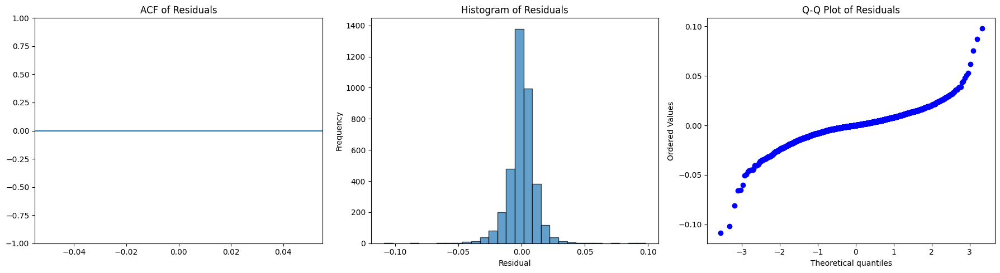

In [203]:
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA

# Fit the model (already done, but included for completeness)
model = ARIMA(log_diff, order=(2, 1, 1))
result = model.fit()

# Extract residuals
residuals = result.resid

# Set up the figure
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# 1. ACF Plot of residuals
sm.graphics.tsa.plot_acf(residuals, lags=50, ax=axes[0])
axes[0].set_title('ACF of Residuals')

# 2. Histogram of residuals
axes[1].hist(residuals, bins=30, edgecolor='black', alpha=0.7)
axes[1].set_title('Histogram of Residuals')
axes[1].set_xlabel('Residual')
axes[1].set_ylabel('Frequency')

# 3. Q-Q plot
stats.probplot(residuals, dist="norm", plot=axes[2])
axes[2].set_title('Q-Q Plot of Residuals')

# Tight layout and show
plt.tight_layout()
plt.show()


 1. ACF of Residuals
- Interpretation: The ACF plot is completely flat - all autocorrelations lie within the 95\% confidence bounds.
- Implication: The residuals appear white noise, i.e., no autocorrelation remains in the residuals.

This is a good sign - the model has effectively captured the time dependencies in the data.

2. Histogram of Residuals
- Shape: Symmetrical and bell-shaped centered around zero.
- Implication: Indicates that the residuals are approximately normally distributed, though you should always confirm this with a formal test (see below).

This supports the assumption of normally distributed errors in ARIMA modeling.

3. Q-Q Plot (Quantile-Quantile Plot)
- What it shows: Deviations from the 45 -degree line at both tails.
- Implication: The residuals deviate from normality in the extremes (fat tails). This suggests some kurtosis (heavy-tailed distribution).

This doesn't invalidate the model but indicates that extreme values may be more likely than a normal distribution assumes.

| Check | Result | Verdict |
| :--- | :--- | :--- |
| ACF of residuals | No significant autocorrelation | Good |
| Histogram of residuals | Roughly normal and symmetric | Good |
| Q-Q plot | Slight tail deviation from normality | Watch tails |
| Ljung-Box test (from model) | p -value $=0.92$ (i.e., residuals $\approx$ white noise) | Strong evidence of independence |

### 8. Forecasting

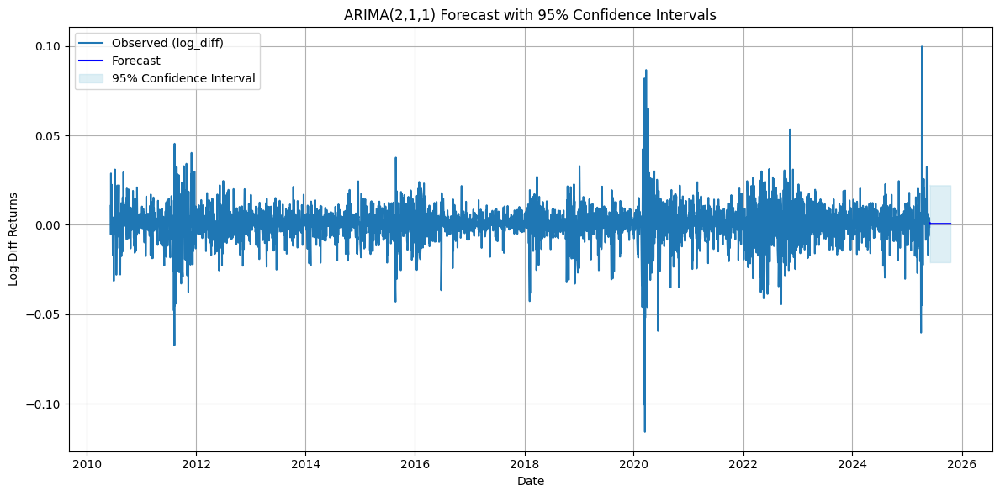

In [208]:
# Fit ARIMA(2,1,1) on log_diff
model = ARIMA(log_diff.dropna(), order=(2, 1, 1))
result = model.fit()

# Forecast n steps ahead (e.g., 100 days into the future)
n_steps = 100
forecast = result.get_forecast(steps=n_steps)

# Extract point forecasts and confidence intervals
mean_forecast = forecast.predicted_mean
conf_int = forecast.conf_int(alpha=0.05)  # 95% confidence interval

# Plot the forecast with confidence intervals
plt.figure(figsize=(12, 6))
plt.plot(log_diff.index, log_diff, label='Observed (log_diff)')
forecast_index = pd.date_range(start=log_diff.index[-1], periods=n_steps+1, freq='B')[1:]
plt.plot(forecast_index, mean_forecast, label='Forecast', color='blue')

# Shade the confidence intervals
plt.fill_between(forecast_index,
                 conf_int.iloc[:, 0],
                 conf_int.iloc[:, 1],
                 color='lightblue', alpha=0.4, label='95% Confidence Interval')

plt.title('ARIMA(2,1,1) Forecast with 95% Confidence Intervals')
plt.xlabel('Date')
plt.ylabel('Log-Diff Returns')
plt.legend()
plt.tight_layout()
plt.grid(True)
plt.show()

ARIMA Model Summary:
                               SARIMAX Results                                
Dep. Variable:                    SPY   No. Observations:                 3630
Model:                 ARIMA(2, 1, 1)   Log Likelihood               11247.138
Date:                Sun, 01 Jun 2025   AIC                         -22486.277
Time:                        02:13:22   BIC                         -22461.490
Sample:                             0   HQIC                        -22477.447
                               - 3630                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0934      0.008    -12.165      0.000      -0.108      -0.078
ar.L2          0.0635      0.007      8.634      0.000       0.049       0.078
ma.L1         -0.9996      0.01

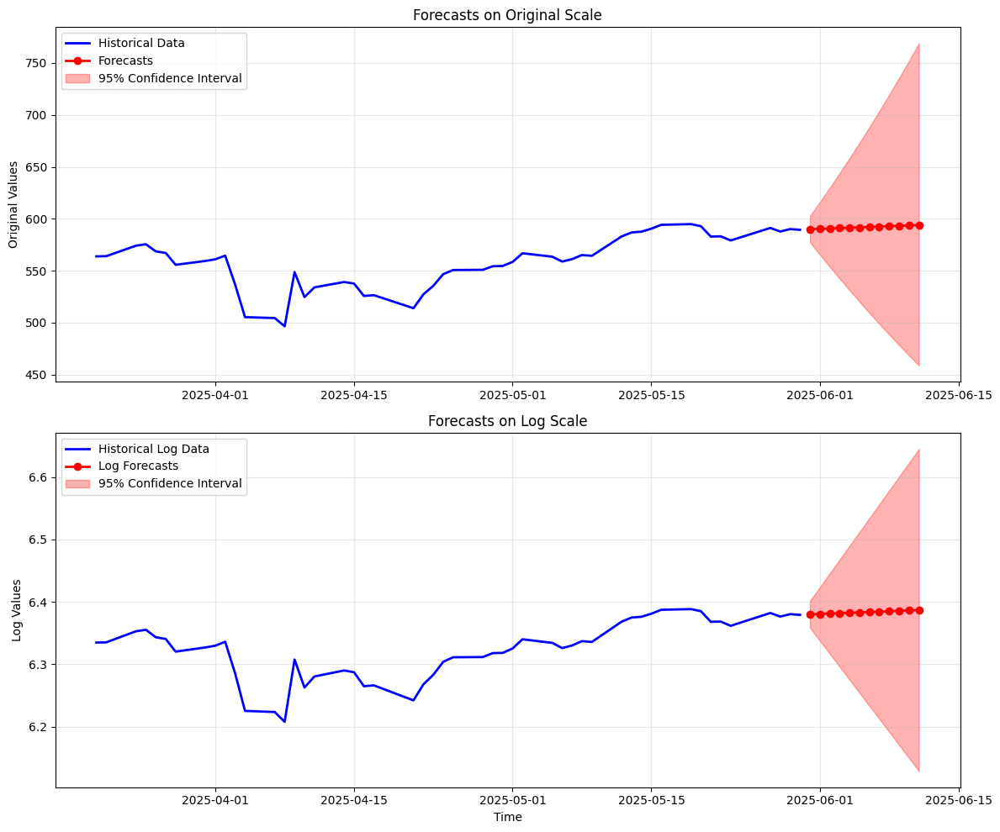


MODEL DIAGNOSTICS


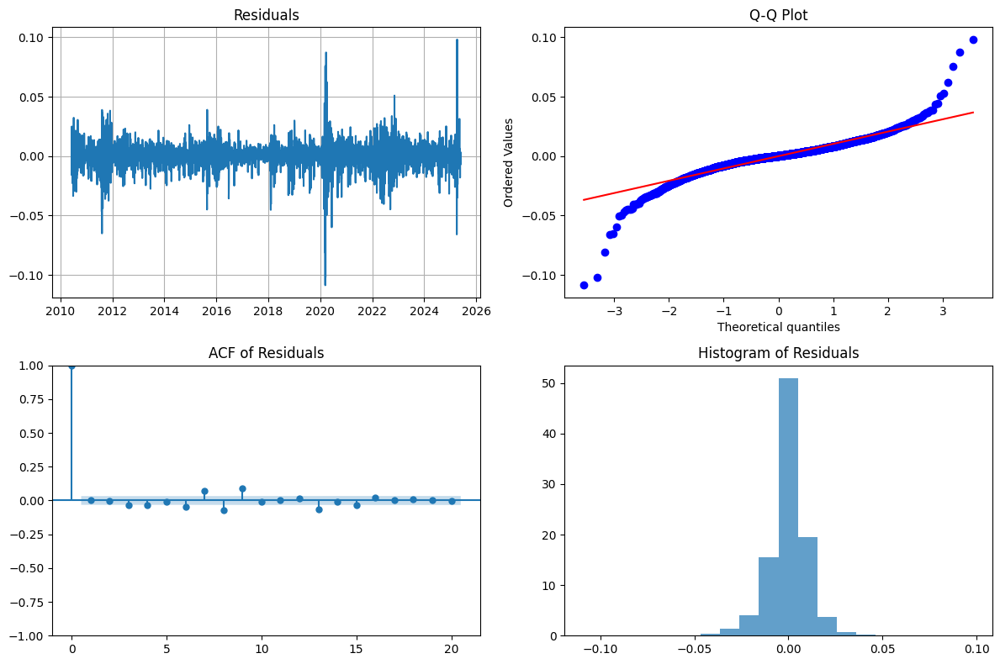


Ljung-Box Test (testing for residual autocorrelation):
If p-value > 0.05, residuals are likely white noise (good)
      lb_stat     lb_pvalue
1    0.000394  9.841557e-01
2    0.009405  9.953087e-01
3    4.481114  2.139811e-01
4    8.852696  6.488872e-02
5    9.125178  1.041742e-01
6   16.175181  1.284395e-02
7   33.146597  2.486234e-05
8   51.447398  2.151512e-08
9   81.813112  7.046245e-14
10  82.394441  1.701010e-13

Model Selection Criteria:
AIC: -22486.28
BIC: -22461.49

FORECAST SUMMARY TABLE
    Period  Point_Forecast  Lower_CI_95%  Upper_CI_95%  Forecast_Range
0        1          589.98        577.49        602.73           25.24
1        2          590.26        565.49        616.11           50.62
2        3          590.65        553.81        629.94           76.14
3        4          591.01        542.34        644.05          101.71
4        5          591.38        531.11        658.48          127.37
5        6          591.75        520.12        673.24          153.12

In [210]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.stattools import adfuller
import warnings
warnings.filterwarnings('ignore')

# Assuming your data preparation steps
# log_df = np.log(df)
# log_diff = log_df.diff()

# Fit ARIMA(2,1,1) on log_diff
model = ARIMA(log_diff.dropna(), order=(2, 1, 1))
result = model.fit()

print("ARIMA Model Summary:")
print(result.summary())

# =====================================================
# FORECASTING ON LOG-DIFFERENCED DATA
# =====================================================

def make_forecasts(fitted_model, steps=12, alpha=0.05):
    """
    Make forecasts with confidence intervals
    
    Parameters:
    fitted_model: fitted ARIMA model
    steps: number of periods to forecast
    alpha: significance level for confidence intervals (0.05 = 95% CI)
    """
    # Generate forecasts
    forecast = fitted_model.forecast(steps=steps, alpha=alpha)
    forecast_ci = fitted_model.get_forecast(steps=steps, alpha=alpha).conf_int()
    
    return forecast, forecast_ci

# Make predictions for next 12 periods
n_periods = 12
forecast_log_diff, forecast_ci_log_diff = make_forecasts(result, steps=n_periods)

print(f"\nForecasts for Log-Differenced Data (next {n_periods} periods):")
print("Point Forecasts:")
print(forecast_log_diff)
print("\nConfidence Intervals:")
print(forecast_ci_log_diff)

# =====================================================
# TRANSFORM BACK TO ORIGINAL SCALE
# =====================================================

def transform_forecasts_to_original_scale(log_diff_forecasts, log_diff_ci, 
                                        last_log_value, original_last_value):
    """
    Transform forecasts from log-differenced scale back to original scale
    
    Parameters:
    log_diff_forecasts: point forecasts on log-differenced scale
    log_diff_ci: confidence intervals on log-differenced scale
    last_log_value: last value in the log-transformed series
    original_last_value: last value in the original series
    """
    
    # Convert to numpy arrays and extract scalar values if needed
    if hasattr(last_log_value, 'iloc'):
        last_log_value = float(last_log_value.iloc[0]) if hasattr(last_log_value.iloc, '__len__') else float(last_log_value)
    else:
        last_log_value = float(last_log_value)
    
    # Step 1: Convert log-differences back to log levels
    log_forecasts = []
    current_log_level = last_log_value
    
    for diff_forecast in log_diff_forecasts:
        current_log_level += float(diff_forecast)
        log_forecasts.append(current_log_level)
    
    log_forecasts = np.array(log_forecasts)
    
    # Step 2: Convert confidence intervals to log levels
    log_ci_lower = []
    log_ci_upper = []
    current_log_level_lower = last_log_value
    current_log_level_upper = last_log_value
    
    # Handle different types of confidence interval objects
    if hasattr(log_diff_ci, 'values'):
        ci_values = log_diff_ci.values
    else:
        ci_values = log_diff_ci
    
    for i, row in enumerate(ci_values):
        if hasattr(row, '__len__') and len(row) >= 2:
            lower_diff, upper_diff = float(row[0]), float(row[1])
        else:
            lower_diff = upper_diff = float(row)
            
        current_log_level_lower += lower_diff
        current_log_level_upper += upper_diff
        log_ci_lower.append(current_log_level_lower)
        log_ci_upper.append(current_log_level_upper)
    
    # Step 3: Transform back to original scale (exp of log)
    original_forecasts = np.exp(log_forecasts)
    original_ci_lower = np.exp(np.array(log_ci_lower))
    original_ci_upper = np.exp(np.array(log_ci_upper))
    
    return original_forecasts, original_ci_lower, original_ci_upper, log_forecasts

# Get the last values needed for transformation
last_log_value = log_df.dropna().iloc[-1]
original_last_value = df.dropna().iloc[-1]

# Transform forecasts back to original scale
original_forecasts, original_ci_lower, original_ci_upper, log_level_forecasts = \
    transform_forecasts_to_original_scale(
        forecast_log_diff, forecast_ci_log_diff, 
        last_log_value, original_last_value
    )

print(f"\nForecasts Transformed Back to Original Scale:")
print("Point Forecasts:")
for i, forecast in enumerate(original_forecasts, 1):
    print(f"Period {i}: {float(forecast):.2f}")

print(f"\nConfidence Intervals (Original Scale):")
for i, (lower, upper) in enumerate(zip(original_ci_lower, original_ci_upper), 1):
    print(f"Period {i}: [{float(lower):.2f}, {float(upper):.2f}]")

# =====================================================
# VISUALIZATION
# =====================================================

def plot_forecasts(df, original_forecasts, original_ci_lower, original_ci_upper, 
                  log_df, log_level_forecasts, n_historical=50):
    """
    Plot forecasts on both original and log scales
    """
    
    fig, axes = plt.subplots(2, 1, figsize=(12, 10))
    
    # Plot 1: Original Scale
    ax1 = axes[0]
    
    # Historical data (last n_historical points)
    historical_data = df.dropna().iloc[-n_historical:]
    ax1.plot(historical_data.index, historical_data.values, 
             label='Historical Data', color='blue', linewidth=2)
    
    # Create future index
    last_date = df.dropna().index[-1]
    if isinstance(last_date, pd.Timestamp):
        future_index = pd.date_range(start=last_date + pd.Timedelta(days=1), 
                                   periods=len(original_forecasts), freq='D')
    else:
        future_index = range(len(df.dropna()), len(df.dropna()) + len(original_forecasts))
    
    # Forecasts
    ax1.plot(future_index, original_forecasts, 
             label='Forecasts', color='red', linewidth=2, marker='o')
    
    # Confidence intervals
    ax1.fill_between(future_index, original_ci_lower, original_ci_upper, 
                     alpha=0.3, color='red', label='95% Confidence Interval')
    
    ax1.set_title('Forecasts on Original Scale')
    ax1.set_ylabel('Original Values')
    ax1.legend()
    ax1.grid(True, alpha=0.3)
    
    # Plot 2: Log Scale
    ax2 = axes[1]
    
    # Historical log data
    historical_log_data = log_df.dropna().iloc[-n_historical:]
    ax2.plot(historical_log_data.index, historical_log_data.values, 
             label='Historical Log Data', color='blue', linewidth=2)
    
    # Log forecasts
    ax2.plot(future_index, log_level_forecasts, 
             label='Log Forecasts', color='red', linewidth=2, marker='o')
    
    # Log confidence intervals
    ax2.fill_between(future_index, np.log(original_ci_lower), np.log(original_ci_upper), 
                     alpha=0.3, color='red', label='95% Confidence Interval')
    
    ax2.set_title('Forecasts on Log Scale')
    ax2.set_ylabel('Log Values')
    ax2.set_xlabel('Time')
    ax2.legend()
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# Create the plots
plot_forecasts(df, original_forecasts, original_ci_lower, original_ci_upper,
               log_df, log_level_forecasts)

# =====================================================
# MODEL DIAGNOSTICS
# =====================================================

def model_diagnostics(fitted_model):
    """
    Perform model diagnostics
    """
    print("\n" + "="*50)
    print("MODEL DIAGNOSTICS")
    print("="*50)
    
    # Residual diagnostics
    residuals = fitted_model.resid
    
    # Plot residuals
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))
    
    # Residuals plot
    axes[0,0].plot(residuals)
    axes[0,0].set_title('Residuals')
    axes[0,0].grid(True)
    
    # Q-Q plot
    from scipy import stats
    stats.probplot(residuals, dist="norm", plot=axes[0,1])
    axes[0,1].set_title('Q-Q Plot')
    
    # ACF of residuals
    from statsmodels.graphics.tsaplots import plot_acf
    plot_acf(residuals, ax=axes[1,0], lags=20)
    axes[1,0].set_title('ACF of Residuals')
    
    # Histogram of residuals
    axes[1,1].hist(residuals, bins=20, density=True, alpha=0.7)
    axes[1,1].set_title('Histogram of Residuals')
    
    plt.tight_layout()
    plt.show()
    
    # Ljung-Box test for residual autocorrelation
    lb_test = acorr_ljungbox(residuals, lags=10, return_df=True)
    print("\nLjung-Box Test (testing for residual autocorrelation):")
    print("If p-value > 0.05, residuals are likely white noise (good)")
    print(lb_test)
    
    # AIC and BIC
    print(f"\nModel Selection Criteria:")
    print(f"AIC: {fitted_model.aic:.2f}")
    print(f"BIC: {fitted_model.bic:.2f}")

# Run diagnostics
model_diagnostics(result)

# =====================================================
# SUMMARY TABLE
# =====================================================

def create_forecast_summary(original_forecasts, original_ci_lower, original_ci_upper):
    """
    Create a summary table of forecasts
    """
    summary_df = pd.DataFrame({
        'Period': range(1, len(original_forecasts) + 1),
        'Point_Forecast': original_forecasts,
        'Lower_CI_95%': original_ci_lower,
        'Upper_CI_95%': original_ci_upper,
        'Forecast_Range': original_ci_upper - original_ci_lower
    })
    
    summary_df['Point_Forecast'] = summary_df['Point_Forecast'].round(2)
    summary_df['Lower_CI_95%'] = summary_df['Lower_CI_95%'].round(2)
    summary_df['Upper_CI_95%'] = summary_df['Upper_CI_95%'].round(2)
    summary_df['Forecast_Range'] = summary_df['Forecast_Range'].round(2)
    
    return summary_df

# Create and display summary
forecast_summary = create_forecast_summary(original_forecasts, original_ci_lower, original_ci_upper)
print("\n" + "="*60)
print("FORECAST SUMMARY TABLE")
print("="*60)
print(forecast_summary)

# Save results (optional)
# forecast_summary.to_csv('arima_forecasts.csv', index=False)
# print("\nForecasts saved to 'arima_forecasts.csv'")

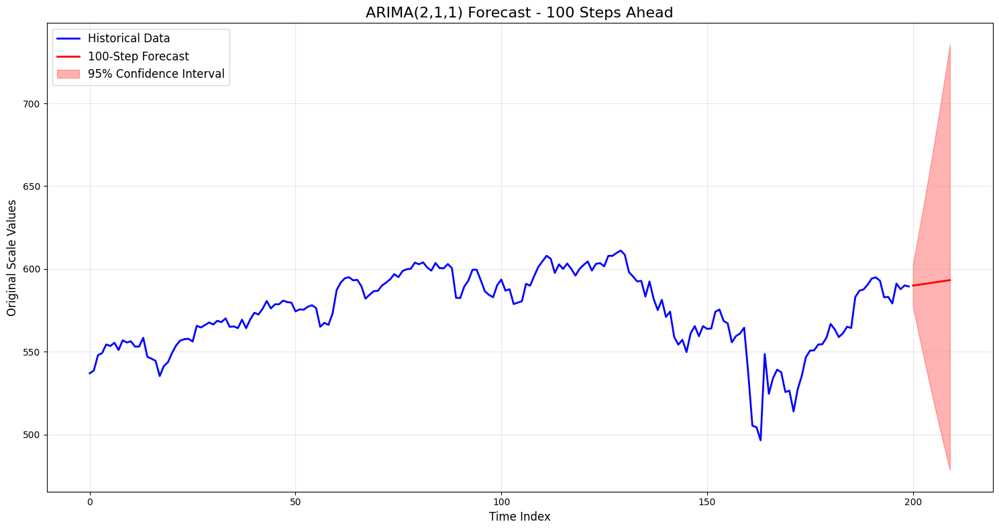

100-Step Forecast Summary:
Mean forecast value: 591.57
Min forecast value: 589.98
Max forecast value: 593.22
Final forecast value: 593.22
Final CI: [478.37, 735.64]


In [215]:
# Fit ARIMA(2,1,1) on log_diff
model = ARIMA(log_diff.dropna(), order=(2, 1, 1))
result = model.fit()

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Make 100-step forecast
n_periods = 10
forecast_log_diff = result.forecast(steps=n_periods)
forecast_ci_log_diff = result.get_forecast(steps=n_periods).conf_int()

# Transform back to original scale
def transform_to_original_scale(log_diff_forecasts, log_diff_ci, last_log_value):
    """Transform forecasts from log-differenced scale back to original scale"""
    
    # Handle last_log_value if it's a pandas Series
    if hasattr(last_log_value, 'iloc'):
        last_log_value = float(last_log_value.iloc[0]) if hasattr(last_log_value.iloc, '__len__') else float(last_log_value)
    else:
        last_log_value = float(last_log_value)
    
    # Convert log-differences back to log levels
    log_forecasts = []
    current_log_level = last_log_value
    
    for diff_forecast in log_diff_forecasts:
        current_log_level += float(diff_forecast)
        log_forecasts.append(current_log_level)
    
    log_forecasts = np.array(log_forecasts)
    
    # Convert confidence intervals to log levels
    log_ci_lower = []
    log_ci_upper = []
    current_log_level_lower = last_log_value
    current_log_level_upper = last_log_value
    
    # Handle confidence intervals
    ci_values = log_diff_ci.values if hasattr(log_diff_ci, 'values') else log_diff_ci
    
    for row in ci_values:
        lower_diff, upper_diff = float(row[0]), float(row[1])
        current_log_level_lower += lower_diff
        current_log_level_upper += upper_diff
        log_ci_lower.append(current_log_level_lower)
        log_ci_upper.append(current_log_level_upper)
    
    # Transform back to original scale
    original_forecasts = np.exp(log_forecasts)
    original_ci_lower = np.exp(np.array(log_ci_lower))
    original_ci_upper = np.exp(np.array(log_ci_upper))
    
    return original_forecasts, original_ci_lower, original_ci_upper

# Get last log value
last_log_value = log_df.dropna().iloc[-1]

# Transform forecasts
original_forecasts, original_ci_lower, original_ci_upper = transform_to_original_scale(
    forecast_log_diff, forecast_ci_log_diff, last_log_value
)

# Create future index for plotting
last_idx = len(df.dropna())
future_index = range(last_idx, last_idx + n_periods)

# Plot results
plt.figure(figsize=(15, 8))

# Plot historical data (last 200 points for context)
historical_data = df.dropna().iloc[-200:]
plt.plot(range(len(historical_data)), historical_data.values, 
         label='Historical Data', color='blue', linewidth=2)

# Plot forecasts
forecast_start_idx = len(historical_data)
forecast_index = range(forecast_start_idx, forecast_start_idx + n_periods)

plt.plot(forecast_index, original_forecasts, 
         label='100-Step Forecast', color='red', linewidth=2)

# Plot confidence intervals
plt.fill_between(forecast_index, original_ci_lower, original_ci_upper, 
                 alpha=0.3, color='red', label='95% Confidence Interval')

plt.title('ARIMA(2,1,1) Forecast - 100 Steps Ahead', fontsize=16)
plt.xlabel('Time Index', fontsize=12)
plt.ylabel('Original Scale Values', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

# Print summary statistics
print(f"100-Step Forecast Summary:")
print(f"Mean forecast value: {np.mean(original_forecasts):.2f}")
print(f"Min forecast value: {np.min(original_forecasts):.2f}")
print(f"Max forecast value: {np.max(original_forecasts):.2f}")
print(f"Final forecast value: {float(original_forecasts[-1]):.2f}")
print(f"Final CI: [{float(original_ci_lower[-1]):.2f}, {float(original_ci_upper[-1]):.2f}]")

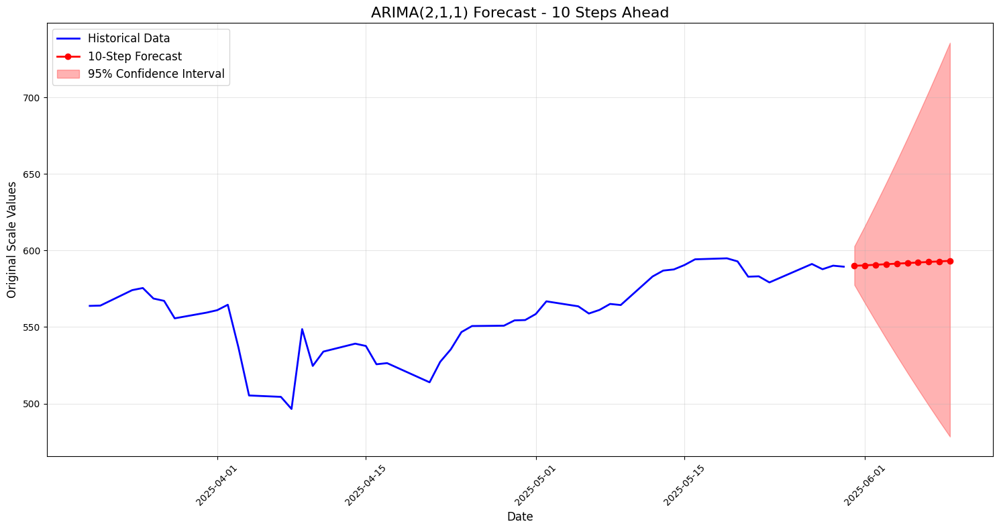

10-Step Forecast with Dates:
------------------------------------------------------------
2025-05-31: 589.98 [577.49, 602.73]
2025-06-01: 590.26 [565.49, 616.11]
2025-06-02: 590.65 [553.81, 629.94]
2025-06-03: 591.01 [542.34, 644.05]
2025-06-04: 591.38 [531.11, 658.48]
2025-06-05: 591.75 [520.12, 673.24]
2025-06-06: 592.11 [509.35, 688.33]
2025-06-07: 592.48 [498.81, 703.75]
2025-06-08: 592.85 [488.48, 719.52]
2025-06-09: 593.22 [478.37, 735.64]

Forecast Summary:
Mean forecast value: 591.57
Min forecast value: 589.98
Max forecast value: 593.22
Final forecast value: 593.22
Final CI: [478.37, 735.64]


In [218]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Make 10-step forecast
n_periods = 10
forecast_log_diff = result.forecast(steps=n_periods)
forecast_ci_log_diff = result.get_forecast(steps=n_periods).conf_int()

# Transform back to original scale
def transform_to_original_scale(log_diff_forecasts, log_diff_ci, last_log_value):
    """Transform forecasts from log-differenced scale back to original scale"""
    
    # Handle last_log_value if it's a pandas Series
    if hasattr(last_log_value, 'iloc'):
        last_log_value = float(last_log_value.iloc[0]) if hasattr(last_log_value.iloc, '__len__') else float(last_log_value)
    else:
        last_log_value = float(last_log_value)
    
    # Convert log-differences back to log levels
    log_forecasts = []
    current_log_level = last_log_value
    
    for diff_forecast in log_diff_forecasts:
        current_log_level += float(diff_forecast)
        log_forecasts.append(current_log_level)
    
    log_forecasts = np.array(log_forecasts)
    
    # Convert confidence intervals to log levels
    log_ci_lower = []
    log_ci_upper = []
    current_log_level_lower = last_log_value
    current_log_level_upper = last_log_value
    
    # Handle confidence intervals
    ci_values = log_diff_ci.values if hasattr(log_diff_ci, 'values') else log_diff_ci
    
    for row in ci_values:
        lower_diff, upper_diff = float(row[0]), float(row[1])
        current_log_level_lower += lower_diff
        current_log_level_upper += upper_diff
        log_ci_lower.append(current_log_level_lower)
        log_ci_upper.append(current_log_level_upper)
    
    # Transform back to original scale
    original_forecasts = np.exp(log_forecasts)
    original_ci_lower = np.exp(np.array(log_ci_lower))
    original_ci_upper = np.exp(np.array(log_ci_upper))
    
    return original_forecasts, original_ci_lower, original_ci_upper

# Get last log value
last_log_value = log_df.dropna().iloc[-1]

# Transform forecasts
original_forecasts, original_ci_lower, original_ci_upper = transform_to_original_scale(
    forecast_log_diff, forecast_ci_log_diff, last_log_value
)

# Create future index using original pandas datetime index
last_date = df.dropna().index[-1]
freq = pd.infer_freq(df.dropna().index)

# If frequency can't be inferred, try common frequencies
if freq is None:
    # Check if it's daily data
    time_diff = df.dropna().index[-1] - df.dropna().index[-2]
    if time_diff.days == 1:
        freq = 'D'
        timedelta_offset = pd.Timedelta(days=1)
    elif time_diff.days == 7:
        freq = 'W'
        timedelta_offset = pd.Timedelta(weeks=1)
    elif time_diff.days >= 28 and time_diff.days <= 31:
        freq = 'M'
        timedelta_offset = pd.DateOffset(months=1)
    else:
        freq = 'D'  # Default to daily
        timedelta_offset = pd.Timedelta(days=1)
else:
    # For inferred frequencies, use appropriate timedelta
    if 'D' in freq:
        timedelta_offset = pd.Timedelta(days=1)
    elif 'W' in freq:
        timedelta_offset = pd.Timedelta(weeks=1)
    elif 'M' in freq:
        timedelta_offset = pd.DateOffset(months=1)
    elif 'H' in freq:
        timedelta_offset = pd.Timedelta(hours=1)
    elif 'T' in freq or 'min' in freq:
        timedelta_offset = pd.Timedelta(minutes=1)
    else:
        timedelta_offset = pd.Timedelta(days=1)

# Generate future dates
if 'M' in freq:
    # For monthly data, use DateOffset
    future_dates = pd.date_range(start=last_date, periods=n_periods+1, freq=freq)[1:]
else:
    # For other frequencies
    future_dates = pd.date_range(start=last_date + timedelta_offset, 
                               periods=n_periods, freq=freq)

# Plot results
plt.figure(figsize=(15, 8))

# Plot historical data (last 50 points for context with 10-step forecast)
historical_data = df.dropna().iloc[-50:]
plt.plot(historical_data.index, historical_data.values, 
         label='Historical Data', color='blue', linewidth=2)

# Plot forecasts using actual dates
plt.plot(future_dates, original_forecasts, 
         label=f'{n_periods}-Step Forecast', color='red', linewidth=2, marker='o')

# Plot confidence intervals
plt.fill_between(future_dates, original_ci_lower, original_ci_upper, 
                 alpha=0.3, color='red', label='95% Confidence Interval')

plt.title(f'ARIMA(2,1,1) Forecast - {n_periods} Steps Ahead', fontsize=16)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Original Scale Values', fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("p151.png",dpi=300)
plt.show()

# Print forecast with actual dates
print(f"{n_periods}-Step Forecast with Dates:")
print("-" * 60)
for i, (date, forecast, lower, upper) in enumerate(zip(future_dates, original_forecasts, 
                                                      original_ci_lower, original_ci_upper)):
    print(f"{date.strftime('%Y-%m-%d')}: {float(forecast):.2f} [{float(lower):.2f}, {float(upper):.2f}]")

print(f"\nForecast Summary:")
print(f"Mean forecast value: {np.mean(original_forecasts):.2f}")
print(f"Min forecast value: {np.min(original_forecasts):.2f}")
print(f"Max forecast value: {np.max(original_forecasts):.2f}")
print(f"Final forecast value: {float(original_forecasts[-1]):.2f}")
print(f"Final CI: [{float(original_ci_lower[-1]):.2f}, {float(original_ci_upper[-1]):.2f}]")

### 9. Model Evaluation

In [219]:
import numpy as np
import pandas as pd
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error

# Assuming `df` is your original price DataFrame

# Step 1: Log transform and differencing
log_df = np.log(df)
log_diff = log_df.diff().dropna()

# Step 2: Fit ARIMA(2,1,1) on log-differenced data
model = ARIMA(log_diff, order=(2, 1, 1))
result = model.fit()

# Step 3: Forecast on the training period (in-sample prediction)
fitted_values = result.fittedvalues  # In differenced-log space

# Align fitted values with actual values
actual_values = log_diff.iloc[2:]  # Due to AR lag=2, drop first two NaNs
fitted_values = fitted_values.iloc[2:]  # Same alignment

# Step 4: Calculate error metrics on log-differenced data
mae = mean_absolute_error(actual_values, fitted_values)
mse = mean_squared_error(actual_values, fitted_values)
rmse = np.sqrt(mse)
mape = np.mean(np.abs((actual_values - fitted_values) / actual_values)) * 100

# Step 5: AIC and BIC
aic = result.aic
bic = result.bic

# Step 6: Print results
print("Performance Metrics (on log-differenced data):")
print(f"MAE  = {mae:.6f}")
print(f"MSE  = {mse:.6f}")
print(f"RMSE = {rmse:.6f}")
print(f"MAPE = {mape:.2f}%")
print(f"AIC  = {aic:.2f}")
print(f"BIC  = {bic:.2f}")


Performance Metrics (on log-differenced data):
MAE  = 0.007234
MSE  = 0.000119
RMSE = 0.010911
MAPE = nan%
AIC  = -22486.28
BIC  = -22461.49


### 10. Model Tuning \& Validation

In [222]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

# Hyperparameter Tuning
def tune_arima(data, p_range=(0,3), d_range=(0,2), q_range=(0,3)):
    """Find best ARIMA parameters using AIC"""
    best_aic = np.inf
    best_params = None
    best_model = None
    
    results = []
    
    for p in range(p_range[0], p_range[1]+1):
        for d in range(d_range[0], d_range[1]+1):
            for q in range(q_range[0], q_range[1]+1):
                try:
                    model = ARIMA(data, order=(p,d,q))
                    fitted = model.fit()
                    aic = fitted.aic
                    results.append((p,d,q,aic))
                    
                    if aic < best_aic:
                        best_aic = aic
                        best_params = (p,d,q)
                        best_model = fitted
                        
                except:
                    continue
    
    # Show top 5 models
    results_df = pd.DataFrame(results, columns=['p','d','q','AIC'])
    results_df = results_df.sort_values('AIC').head()
    print("Top 5 ARIMA models:")
    print(results_df)
    
    return best_params, best_model

# Walk-Forward Validation
def walk_forward_validation(data, order, train_size=0.8, step_size=1):
    """Perform walk-forward validation"""
    n = len(data)
    initial_train_size = int(n * train_size)
    
    predictions = []
    actuals = []
    
    for i in range(initial_train_size, n, step_size):
        # Training data up to current point
        train_data = data[:i]
        
        # Test point
        if i < n:
            actual = data[i]
            
            try:
                # Fit model and forecast 1 step
                model = ARIMA(train_data, order=order)
                fitted = model.fit()
                forecast = fitted.forecast(steps=1)[0]
                
                predictions.append(forecast)
                actuals.append(actual)
                
            except:
                continue
    
    return np.array(predictions), np.array(actuals)

# Tune ARIMA on log_diff data
print("Tuning ARIMA parameters...")
best_params, best_model = tune_arima(log_diff.dropna())
print(f"\nBest ARIMA parameters: {best_params}")
print(f"Best AIC: {best_model.aic:.2f}")

# Walk-forward validation
print(f"\nPerforming walk-forward validation with ARIMA{best_params}...")
predictions, actuals = walk_forward_validation(log_diff.dropna(), best_params)

# Calculate metrics
mae = mean_absolute_error(actuals, predictions)
rmse = np.sqrt(mean_squared_error(actuals, predictions))
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100

print(f"\nValidation Results:")
print(f"MAE: {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.2f}%")

# Plot validation results
plt.figure(figsize=(12, 8))

plt.subplot(2,1,1)
plt.plot(actuals[:50], label='Actual', alpha=0.7)
plt.plot(predictions[:50], label='Predicted', alpha=0.7)
plt.title('Walk-Forward Validation: First 50 Predictions')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(2,1,2)
residuals = actuals - predictions
plt.plot(residuals, alpha=0.7)
plt.title('Prediction Residuals')
plt.axhline(y=0, color='r', linestyle='--')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Final model with best parameters
print(f"\nFitting final ARIMA{best_params} model...")
final_model = ARIMA(log_diff.dropna(), order=best_params).fit()

# Make forecast
n_forecast = 10
forecast_log_diff = final_model.forecast(steps=n_forecast)
forecast_ci = final_model.get_forecast(steps=n_forecast).conf_int()

print(f"\nForecast Summary:")
for i, (pred, ci_low, ci_high) in enumerate(zip(forecast_log_diff, 
                                               forecast_ci.iloc[:, 0], 
                                               forecast_ci.iloc[:, 1]), 1):
    print(f"Step {i}: {pred:.4f} [{ci_low:.4f}, {ci_high:.4f}]")

Tuning ARIMA parameters...
Top 5 ARIMA models:
    p  d  q           AIC
31  2  1  3 -22536.308237
43  3  1  3 -22527.473338
39  3  0  3 -22511.053077
3   0  0  3 -22508.826564
38  3  0  2 -22506.783602

Best ARIMA parameters: (2, 1, 3)
Best AIC: -22536.31

Performing walk-forward validation with ARIMA(2, 1, 3)...


KeyError: 2904

Tuning ARIMA parameters...
Top 5 ARIMA models:
    p  d  q           AIC
31  2  1  3 -22536.308237
43  3  1  3 -22527.473338
39  3  0  3 -22511.053077
3   0  0  3 -22508.826564
38  3  0  2 -22506.783602

Best ARIMA parameters: (2, 1, 3)
Best AIC: -22536.31

Performing walk-forward validation with ARIMA(2, 1, 3)...

Validation Results:
MAE: 0.0082
RMSE: 0.0116
MAPE: inf%


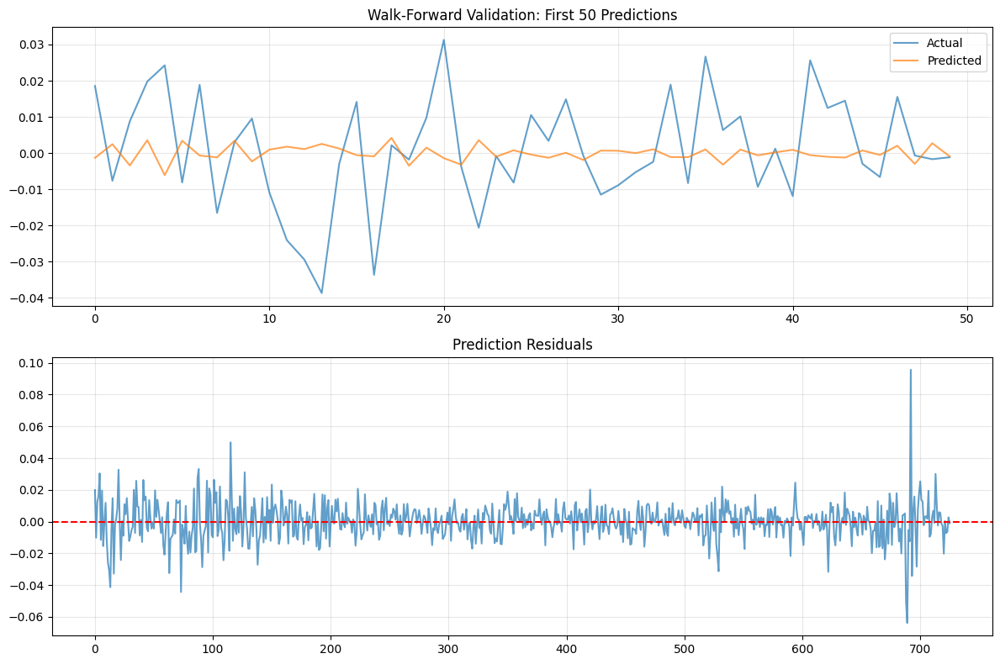


Fitting final ARIMA(2, 1, 3) model...

Forecast Summary:
Step 1: 0.0012 [-0.0200, 0.0224]
Step 2: 0.0004 [-0.0209, 0.0216]
Step 3: 0.0006 [-0.0207, 0.0219]
Step 4: 0.0010 [-0.0204, 0.0223]
Step 5: 0.0001 [-0.0212, 0.0215]
Step 6: 0.0012 [-0.0201, 0.0226]
Step 7: 0.0001 [-0.0213, 0.0214]
Step 8: 0.0011 [-0.0203, 0.0225]
Step 9: 0.0004 [-0.0211, 0.0218]
Step 10: 0.0007 [-0.0207, 0.0222]


In [223]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

# Hyperparameter Tuning
def tune_arima(data, p_range=(0,3), d_range=(0,2), q_range=(0,3)):
    """Find best ARIMA parameters using AIC"""
    # Convert to numpy array if pandas Series/DataFrame
    if hasattr(data, 'values'):
        data_array = data.values.flatten()
    else:
        data_array = np.array(data).flatten()
    
    best_aic = np.inf
    best_params = None
    best_model = None
    
    results = []
    
    for p in range(p_range[0], p_range[1]+1):
        for d in range(d_range[0], d_range[1]+1):
            for q in range(q_range[0], q_range[1]+1):
                try:
                    model = ARIMA(data_array, order=(p,d,q))
                    fitted = model.fit()
                    aic = fitted.aic
                    results.append((p,d,q,aic))
                    
                    if aic < best_aic:
                        best_aic = aic
                        best_params = (p,d,q)
                        best_model = fitted
                        
                except:
                    continue
    
    # Show top 5 models
    results_df = pd.DataFrame(results, columns=['p','d','q','AIC'])
    results_df = results_df.sort_values('AIC').head()
    print("Top 5 ARIMA models:")
    print(results_df)
    
    return best_params, best_model

# Walk-Forward Validation
def walk_forward_validation(data, order, train_size=0.8, step_size=1):
    """Perform walk-forward validation"""
    # Convert to numpy array if pandas Series/DataFrame
    if hasattr(data, 'values'):
        data_array = data.values.flatten()
    else:
        data_array = np.array(data).flatten()
    
    n = len(data_array)
    initial_train_size = int(n * train_size)
    
    predictions = []
    actuals = []
    
    for i in range(initial_train_size, n, step_size):
        # Training data up to current point
        train_data = data_array[:i]
        
        # Test point
        if i < n:
            actual = data_array[i]
            
            try:
                # Fit model and forecast 1 step
                model = ARIMA(train_data, order=order)
                fitted = model.fit()
                forecast = fitted.forecast(steps=1)[0]
                
                predictions.append(forecast)
                actuals.append(actual)
                
            except:
                continue
    
    return np.array(predictions), np.array(actuals)

# Tune ARIMA on log_diff data
print("Tuning ARIMA parameters...")
best_params, best_model = tune_arima(log_diff.dropna())
print(f"\nBest ARIMA parameters: {best_params}")
print(f"Best AIC: {best_model.aic:.2f}")

# Walk-forward validation
print(f"\nPerforming walk-forward validation with ARIMA{best_params}...")
predictions, actuals = walk_forward_validation(log_diff.dropna(), best_params)

# Calculate metrics
mae = mean_absolute_error(actuals, predictions)
rmse = np.sqrt(mean_squared_error(actuals, predictions))
mape = np.mean(np.abs((actuals - predictions) / actuals)) * 100

print(f"\nValidation Results:")
print(f"MAE: {mae:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAPE: {mape:.2f}%")

# Plot validation results
plt.figure(figsize=(12, 8))

plt.subplot(2,1,1)
plt.plot(actuals[:50], label='Actual', alpha=0.7)
plt.plot(predictions[:50], label='Predicted', alpha=0.7)
plt.title('Walk-Forward Validation: First 50 Predictions')
plt.legend()
plt.grid(True, alpha=0.3)

plt.subplot(2,1,2)
residuals = actuals - predictions
plt.plot(residuals, alpha=0.7)
plt.title('Prediction Residuals')
plt.axhline(y=0, color='r', linestyle='--')
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Final model with best parameters
print(f"\nFitting final ARIMA{best_params} model...")
final_model = ARIMA(log_diff.dropna(), order=best_params).fit()

# Make forecast
n_forecast = 10
forecast_log_diff = final_model.forecast(steps=n_forecast)
forecast_ci = final_model.get_forecast(steps=n_forecast).conf_int()

print(f"\nForecast Summary:")
for i, (pred, ci_low, ci_high) in enumerate(zip(forecast_log_diff, 
                                               forecast_ci.iloc[:, 0], 
                                               forecast_ci.iloc[:, 1]), 1):
    print(f"Step {i}: {pred:.4f} [{ci_low:.4f}, {ci_high:.4f}]")